# Plots

## Load data

In [1]:
import pandas as pd
import sys
sys.path.append('../')
from utils.plots import *
output_notebook()

file_path = '../data/'
model_name1 = 'ALMA Subtype'
model_name2 = 'AML Epigenomic Risk'
model_name3 = '38CpG-AMLsignature'

# Read the data
df = pd.read_excel(file_path + 'alma_main_results.xlsx', index_col=0).sort_index()

# Replace "AL Epigenomic Subtype" with "ALMA Subtype"
df['ALMA Subtype'] = df['AL Epigenomic Subtype']

# Read the signature results
sig_results = pd.read_excel(file_path + 'signature_results.xlsx', index_col=0).sort_index()

# Read NOPHO AML test cohort
nopho_aml = pd.read_excel('../data/nordic_aml_clinical_data.xlsx', index_col=0)

df = df.join(sig_results)

# Define train and test samples
df_train = df[df['Train-Test']=='Train Sample']
df_test = df[df['Train-Test'] == 'Test Sample']

# remove duplicates from the test cohort
df_test = df_test[~df_test['Patient_ID'].duplicated(keep='last')]
df_test = df_test[~df_test['Clinical Trial'].isin(['UF HemBank'])]

# Prognostic model samples
df_px = df[~df['Vital Status at 5y'].isna()]
df_px2 = df_px[df_px['Clinical Trial'].isin(['AAML0531', 'AAML1031', 'AAML03P1'])]
df_px2 = df_px2[df_px2['Sample Type'].isin(
    ['Diagnosis', 'Primary Blood Derived Cancer - Bone Marrow', 'Primary Blood Derived Cancer - Peripheral Blood'])]
df_px2 = df_px2[~df_px2['Patient_ID'].duplicated(keep='last')]

# drop the samples with missing labels for the ELN AML 2022 Diagnosis
df_dx = df_train[~df_train['WHO 2022 Diagnosis'].isna()]

# exclude the classes with fewer than 5 samples
df_dx = df_dx[~df_dx['WHO 2022 Diagnosis'].isin(['AML with t(9;22); BCR::ABL1'])]

Loading BokehJS ...

## Patient Characteristics

### ALMA (unsupervised)

In [8]:
from tableone import TableOne
from datetime import date

columns = ['Hematopoietic Entity','Age (group years)','Sex',
            'Clinical Trial',]

mytable_cog = TableOne(df_train.reset_index(), columns,
                        overall=False, missing=False,
                        pval=False, pval_adjust=False,
                        htest_name=True,dip_test=True,
                        tukey_test=True, normal_test=True,

                        order={'FLT3 ITD':['Yes','No'],
                                'Age (group years)':['0-5','5-13','13-39','39-60'],
                                'MRD 1 Status': ['Positive'],
                                'Risk Group': ['High Risk', 'Standard Risk'],
                                'FLT3 ITD': ['Yes'],
                                'Leucocyte counts (10⁹/L)': ['≥30'],
                                'Age group (years)': ['≥10']})

mytable_cog.to_excel('../data/pt_characteristics_alma_model_' + str(date.today()) +'.xlsx')

mytable_cog.tabulate(tablefmt="html", 
                        # headers=[score_name,"",'Missing','Discovery','Validation','p-value','Statistical Test']
                        )

,,Overall
n,,3314
"Hematopoietic Entity, n (%)",Acute lymphoblastic leukemia (ALL),700 (28.3)
,Acute myeloid leukemia (AML),1221 (49.4)
,Acute promyelocytic leukemia (APL),31 (1.3)
,Mixed phenotype acute leukemia (MPAL),48 (1.9)
,Myelodysplastic syndrome (MDS or MDS-like),223 (9.0)
,Otherwise-Normal (Control),251 (10.1)
"Age (group years), n (%)",0-5,480 (24.1)
,5-13,483 (24.2)
,13-39,663 (33.2)


### Fine-tuned (supervised) Dx and Px models

In [9]:
columns = ['Age (years)','Age group (years)','Sex','Race or ethnic group',
            'Hispanic or Latino ethnic group', 'MRD 1 Status',
            'Leucocyte counts (10⁹/L)', 'BM leukemic blasts (%)',
            'Risk Group','FLT3 ITD', 'Clinical Trial']

df_test['Age (years)'] = df_test['Age (years)'].astype(float)


all_cohorts = pd.concat([df_dx, df_px2],
                         axis=0, keys=[model_name1,model_name2 + ', ' + model_name3],
                         names=['cohort']).reset_index()

mytable_cog = TableOne(all_cohorts, columns,
                        overall=False, missing=False,
                        pval=False, pval_adjust=False,
                        htest_name=True,dip_test=True,
                        tukey_test=True, normal_test=True,

                        order={'FLT3 ITD':['Yes','No'],
                                'Race or ethnic group':['White','Black or African American','Asian'],
                                'MRD 1 Status': ['Positive'],
                                'Risk Group': ['High Risk', 'Standard Risk'],
                                'FLT3 ITD': ['Yes'],
                                'Leucocyte counts (10⁹/L)': ['≥30'],
                                'Age group (years)': ['≥10']},
                                groupby='cohort')

mytable_cog.to_excel('../data/pt_characteristics_fine-tuned_models_' + str(date.today()) +'.xlsx')

mytable_cog.tabulate(tablefmt="html", 
                        # headers=[score_name,"",score_name,'Validation','p-value','Statistical Test']
)

,,ALMA Subtype,"AML Epigenomic Risk, 38CpG-AMLsignature"
n,,2471,946
"Age (years), mean (SD)",,19.2 (19.7),9.4 (6.3)
"Age group (years), n (%)",≥10,528 (47.4),463 (48.9)
,<10,586 (52.6),483 (51.1)
"Sex, n (%)",Female,711 (50.5),468 (49.5)
,Male,697 (49.5),478 (50.5)
"Race or ethnic group, n (%)",White,1064 (80.5),697 (79.1)
,Black or African American,131 (9.9),102 (11.6)
,Asian,65 (4.9),43 (4.9)
,American Indian or Alaska Native,7 (0.5),5 (0.6)


### By prognostic group

#### Discovery

AML Epigenomic Risk

In [10]:
def pt_characteristics_by_model(df, model_name2, traintest = 'discovery'):
        columns = ['Age (years)','Age group (years)','Sex','Race or ethnic group',
                'Hispanic or Latino ethnic group', 'MRD 1 Status',
                'Leucocyte counts (10⁹/L)', 'BM leukemic blasts (%)',
                'Risk Group', 'Clinical Trial','FLT3 ITD', 'Treatment Arm']

        mytable_cog = TableOne(df, columns,
                                overall=False, missing=False,
                                pval=True, pval_adjust=False,
                                htest_name=True,dip_test=True,
                                tukey_test=True, normal_test=True,

                                order={'FLT3 ITD':['Yes','No'],
                                        'Race or ethnic group':['White','Black or African American','Asian'],
                                        'MRD 1 Status': ['Positive'],
                                        'Risk Group': ['High Risk', 'Standard Risk'],
                                        'FLT3 ITD': ['Yes'],
                                        'Leucocyte counts (10⁹/L)': ['≥30'],
                                        'Age group (years)': ['≥10']},
                                groupby=model_name2)

        mytable_cog.to_excel('../data/pt_characteristics_'+ model_name2 +'_' + traintest + '_' + str(date.today()) + '.xlsx')

        return(mytable_cog.tabulate(tablefmt="html", 
                                headers=[model_name2 + ' ' + traintest,"",'High','Low','p-value','Statistical Test']))

pt_characteristics_by_model(df_px2, model_name2, 'Discovery')

AML Epigenomic Risk Discovery,,High,Low,p-value,Statistical Test
n,,442,504,,
"Age (years), mean (SD)",,8.7 (6.5),10.0 (6.2),0.002,Two Sample T-test
"Age group (years), n (%)",≥10,200 (45.2),263 (52.2),0.039,Chi-squared
,<10,242 (54.8),241 (47.8),,
"Sex, n (%)",Female,215 (48.6),253 (50.2),0.680,Chi-squared
,Male,227 (51.4),251 (49.8),,
"Race or ethnic group, n (%)",White,323 (78.2),374 (79.9),0.971,Chi-squared (warning: expected count < 5)
,Black or African American,52 (12.6),50 (10.7),,
,Asian,20 (4.8),23 (4.9),,
,American Indian or Alaska Native,2 (0.5),3 (0.6),,


38CpG-AMLsignature

In [11]:
pt_characteristics_by_model(df_px2, model_name3, traintest='Discovery')

38CpG-AMLsignature Discovery,,High,Low,p-value,Statistical Test
n,,473,473,,
"Age (years), mean (SD)",,8.8 (6.6),10.0 (6.0),0.003,Two Sample T-test
"Age group (years), n (%)",≥10,215 (45.5),248 (52.4),0.037,Chi-squared
,<10,258 (54.5),225 (47.6),,
"Sex, n (%)",Female,241 (51.0),227 (48.0),0.398,Chi-squared
,Male,232 (49.0),246 (52.0),,
"Race or ethnic group, n (%)",White,341 (78.0),356 (80.2),0.130,Chi-squared (warning: expected count < 5)
,Black or African American,59 (13.5),43 (9.7),,
,Asian,24 (5.5),19 (4.3),,
,American Indian or Alaska Native,2 (0.5),3 (0.7),,


#### Test

AML Epigenomic Risk

In [12]:
pt_characteristics_by_model(df_test, model_name2, 'in AML02,08 trials')

"AML Epigenomic Risk in AML02,08 trials",,High,Low,p-value,Statistical Test
n,,88,112,,
"Age (years), mean (SD)",,7.9 (6.1),9.4 (5.8),0.083,Two Sample T-test
"Age group (years), n (%)",≥10,35 (40.7),60 (53.6),0.098,Chi-squared
,<10,51 (59.3),52 (46.4),,
"Sex, n (%)",Female,38 (43.2),48 (42.9),1.000,Chi-squared
,Male,50 (56.8),64 (57.1),,
"Race or ethnic group, n (%)",White,63 (73.3),79 (70.5),0.688,Chi-squared (warning: expected count < 5)
,Black or African American,14 (16.3),18 (16.1),,
,Asian,1 (1.2),,,
,Other,7 (8.1),14 (12.5),,


38CpG-AMLsignature

In [13]:
pt_characteristics_by_model(df_test, model_name3, traintest='in AML02,08 trials')

"38CpG-AMLsignature in AML02,08 trials",,High,Low,p-value,Statistical Test
n,,111,89,,
"Age (years), mean (SD)",,7.9 (6.2),9.9 (5.6),0.020,Two Sample T-test
"Age group (years), n (%)",≥10,46 (41.8),49 (55.7),0.072,Chi-squared
,<10,64 (58.2),39 (44.3),,
"Sex, n (%)",Female,50 (45.0),36 (40.4),0.611,Chi-squared
,Male,61 (55.0),53 (59.6),,
"Race or ethnic group, n (%)",White,79 (72.5),63 (70.8),0.854,Chi-squared (warning: expected count < 5)
,Black or African American,18 (16.5),14 (15.7),,
,Asian,1 (0.9),,,
,Other,10 (9.2),11 (12.4),,


## Kaplan-Meier Plots

### Overall study population

AML Epigenomic Risk

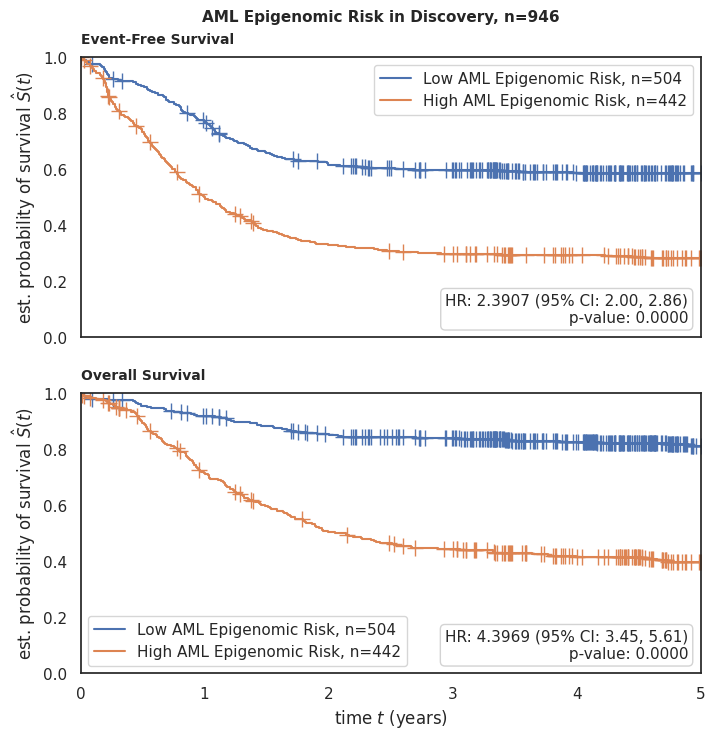

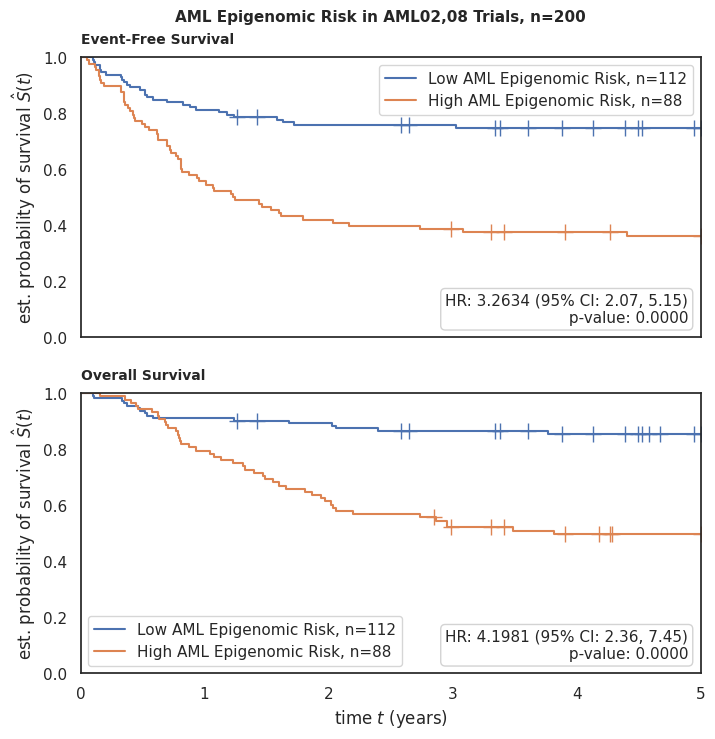

In [2]:

for dataset, trial in zip([df_px2, df_test], 
                          ['Discovery', 'AML02,08 Trials']):
    draw_kaplan_meier(model_name=model_name2,
                        df=dataset,
                        save_survival_table=False,
                        save_plot=False,
                        show_ci=False,
                        add_risk_counts=False,
                        trialname=trial,
                        figsize=(8,8))

38CpG-AMLsignature

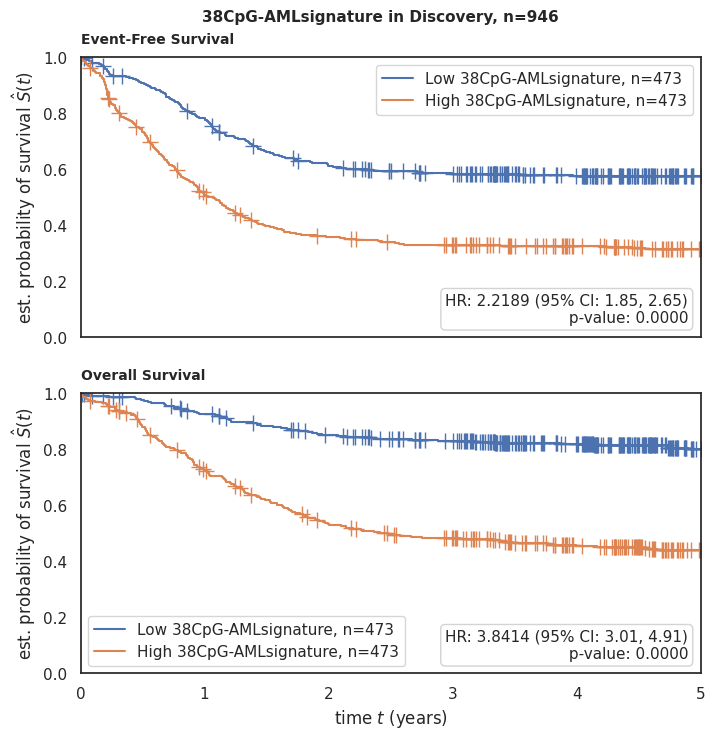

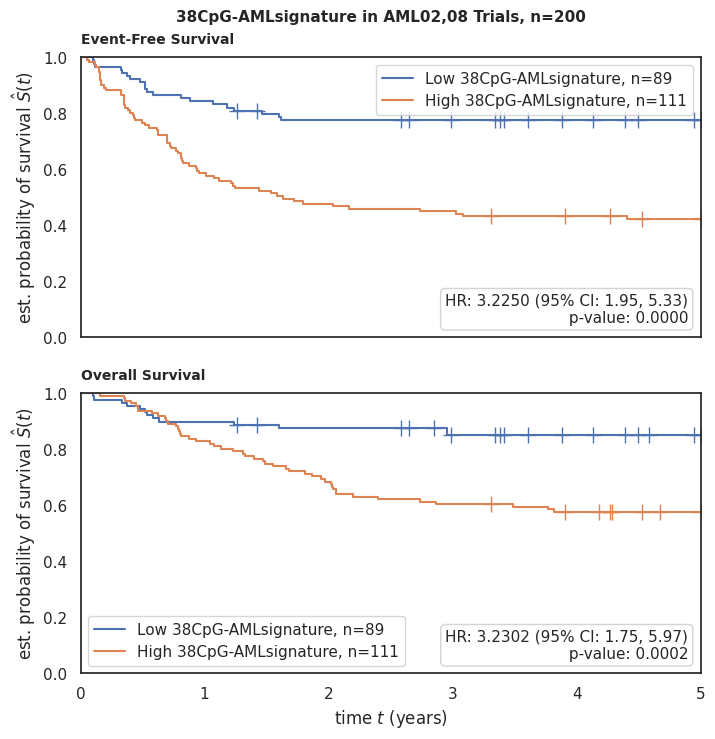

In [3]:
for dataset, trial in zip([df_px2, df_test], 
                          ['Discovery', 'AML02,08 Trials']):

    draw_kaplan_meier(model_name=model_name3,
                        df=dataset,
                        save_survival_table=False,
                        save_plot=False,
                        show_ci=False,
                        add_risk_counts=False,
                        trialname=trial,
                        figsize=(8,8))

### In adult AML

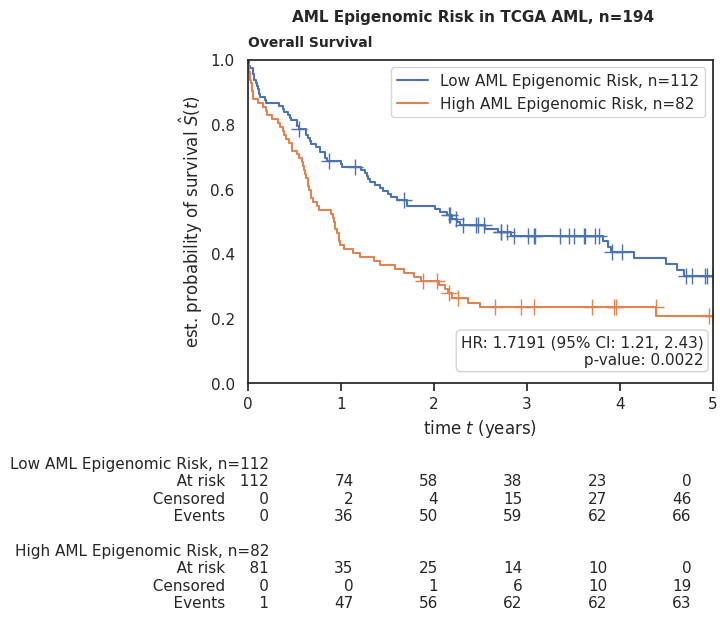

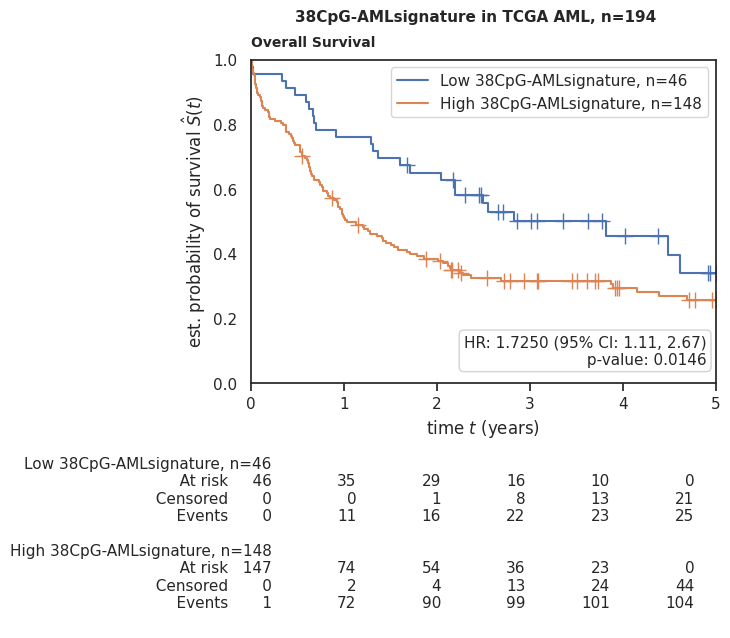

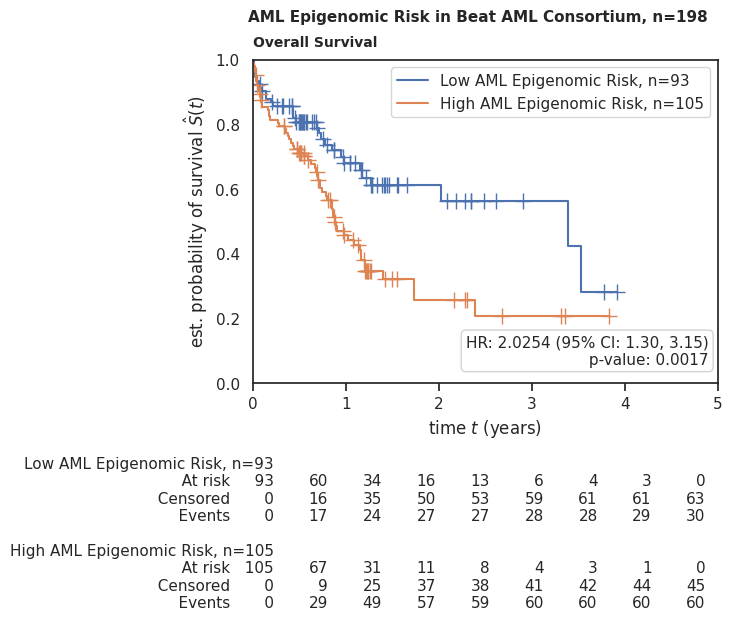

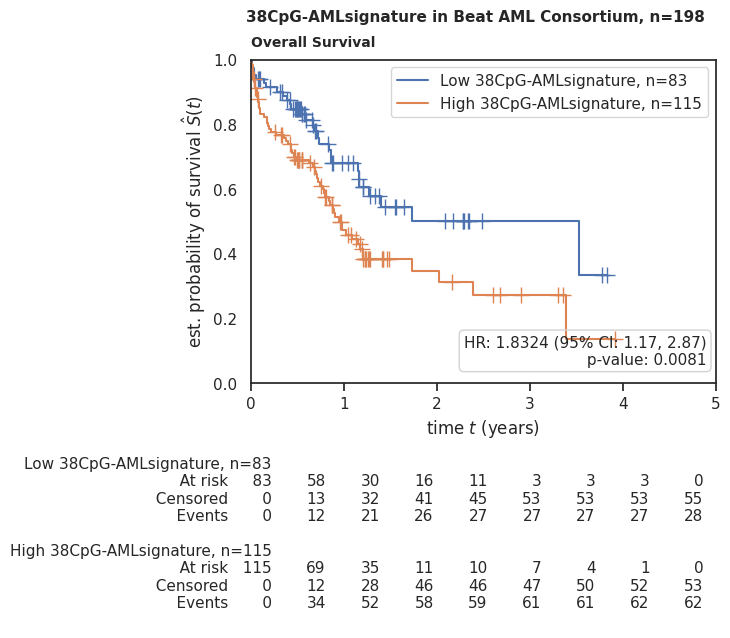

In [5]:
# ignore deprecation warnings
import warnings
warnings.filterwarnings("ignore")

# Select df_train where clinical trials are TCGA AML and Beat AML Consortium
df_adult_aml = df_train[df_train['Clinical Trial'].isin(['TCGA AML', 'Beat AML Consortium'])]

# drop rows where os.evnt and os.time are missing
df_adult_aml = df_adult_aml[~df_adult_aml['os.evnt'].isna()]
df_adult_aml = df_adult_aml[~df_adult_aml['os.time'].isna()]

df_tcga = df_adult_aml[df_adult_aml['Clinical Trial'] == 'TCGA AML']
df_beat_aml = df_adult_aml[df_adult_aml['Clinical Trial'] == 'Beat AML Consortium']

for dataset, trial in zip([df_tcga, df_beat_aml], 
                          ['TCGA AML', 'Beat AML Consortium']):

    draw_kaplan_meier(model_name=model_name2,
                        df=dataset,
                        save_survival_table=False,
                        plot_efs=False,
                        save_plot=False,
                        show_ci=False,
                        add_risk_counts=True,
                        trialname=trial,
                        figsize=(6,4.2),
                        suptitle=1)
    
    draw_kaplan_meier(model_name=model_name3,
                        df=dataset,
                        save_survival_table=False,
                        plot_efs=False,
                        save_plot=False,
                        show_ci=False,
                        add_risk_counts=True,
                        trialname=trial,
                        figsize=(6,4.2),
                        suptitle=1)

### NOPHO AML test

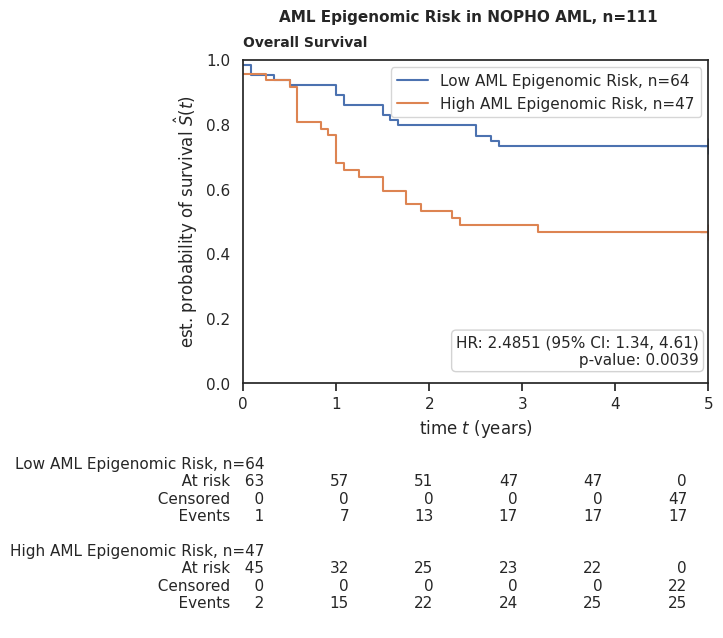

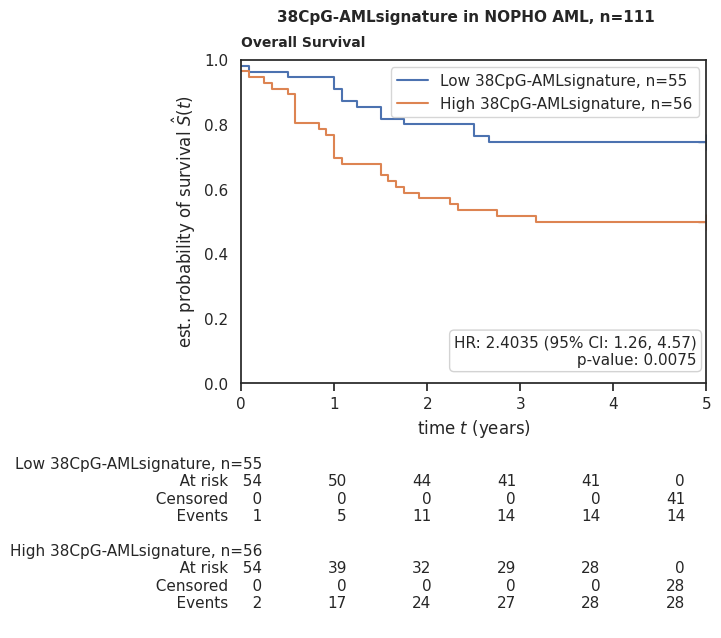

In [28]:
# drop rows where "AML Epigenomic Risk" is missing
nopho_aml2 = nopho_aml[~nopho_aml['AML Epigenomic Risk'].isna()]

# ignore deprecation warnings
import warnings
warnings.filterwarnings("ignore")

draw_kaplan_meier(model_name=model_name2,
                        df=nopho_aml2,
                        save_survival_table=False,
                        plot_efs=False,
                        save_plot=False,
                        show_ci=False,
                        add_risk_counts=True,
                        trialname='NOPHO AML',
                        figsize=(6,4.2),
                        suptitle=1)

draw_kaplan_meier(model_name=model_name3,
                        df=nopho_aml2,
                        save_survival_table=False,
                        plot_efs=False,
                        save_plot=False,
                        show_ci=False,
                        add_risk_counts=True,
                        trialname='NOPHO AML',
                        figsize=(6,4.2),
                        suptitle=1)

### Per FLT3-ITD status

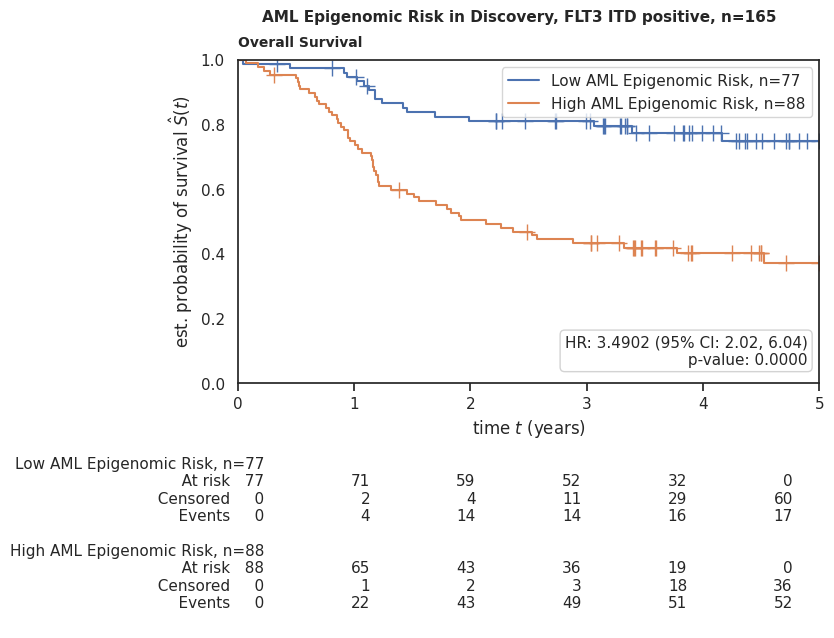

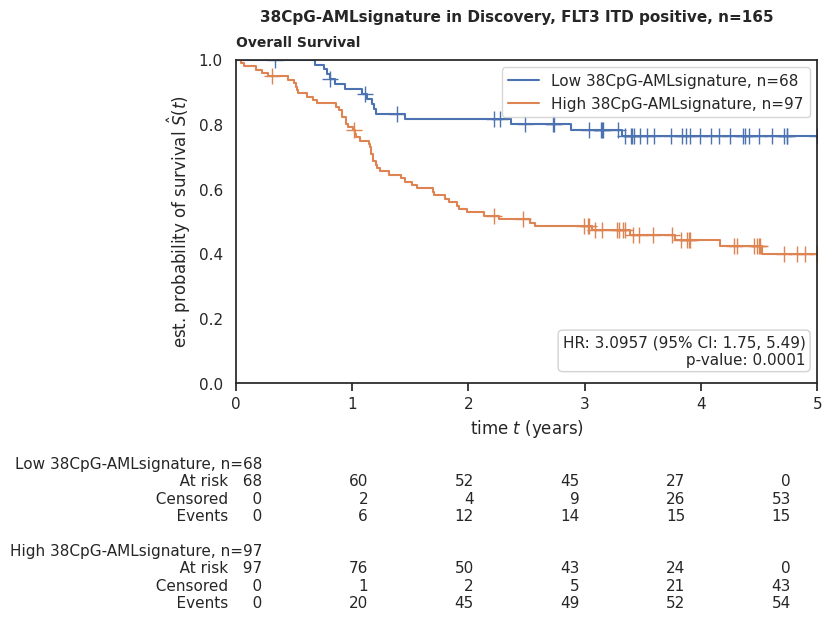

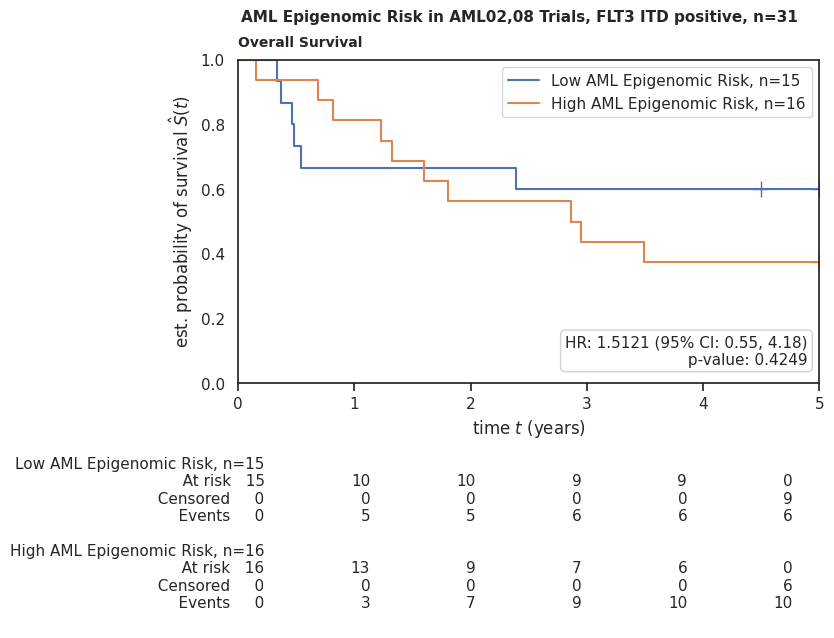

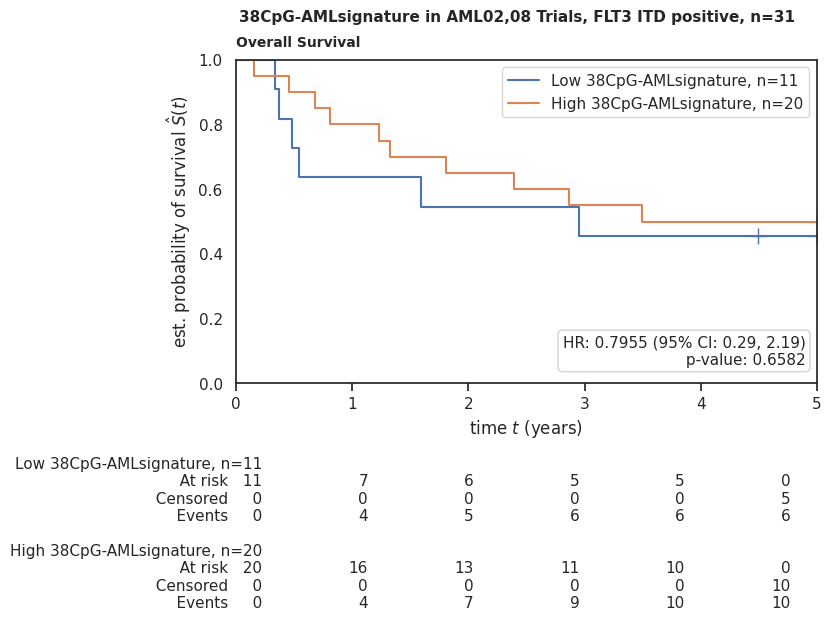

In [79]:
for dataset, trial in zip([df_px2, df_test], ['Discovery', 'AML02,08 Trials']):

    flt3_statuses = ['Yes']
    for status in flt3_statuses:

        draw_kaplan_meier(model_name=model_name2,
                        df=dataset[dataset['FLT3 ITD'] == status],
                        save_survival_table=False,
                        plot_efs=False,
                        save_plot=False,
                        show_ci=False,
                        add_risk_counts=True,
                        trialname=f'{trial}, FLT3 ITD positive',
                        figsize=(7.5,4.2),
                        suptitle=1)
        
        draw_kaplan_meier(model_name=model_name3,
                        df=dataset[dataset['FLT3 ITD'] == status],
                        save_survival_table=False,
                        plot_efs=False,
                        save_plot=False,
                        show_ci=False,
                        add_risk_counts=True,
                        trialname=f'{trial}, FLT3 ITD positive',
                        figsize=(7.5,4.2),
                        suptitle=1)

### Per NPM1 mutation

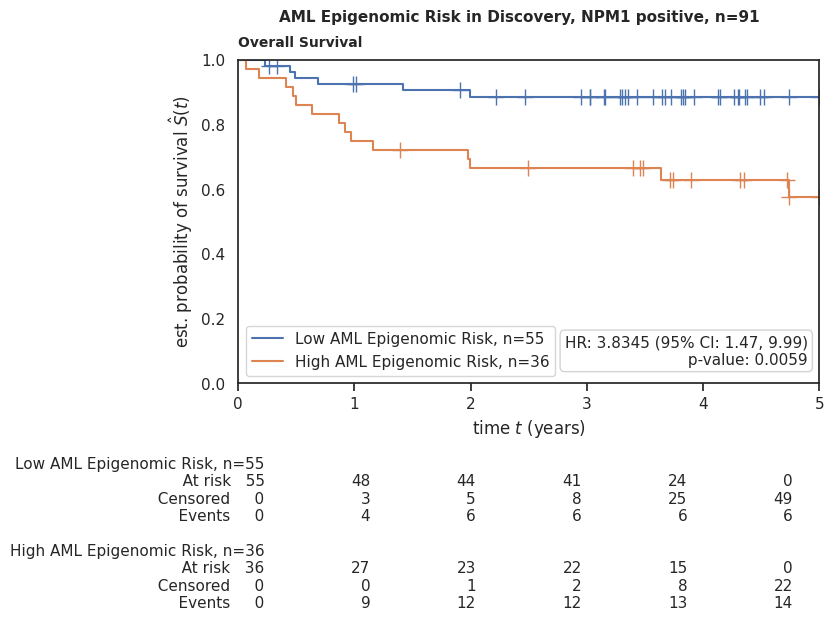

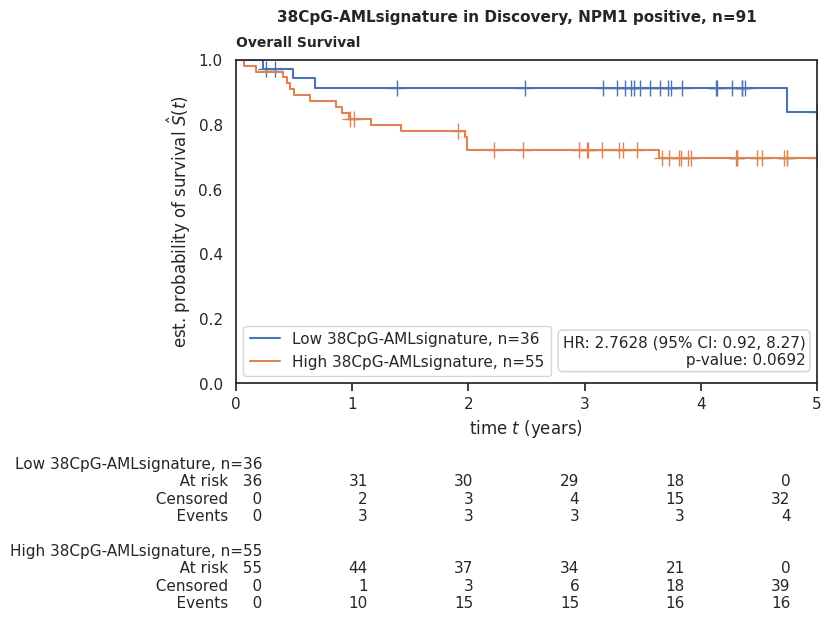

In [75]:
for dataset, trial in zip([df_px2], ['Discovery']):

    statuses = ['Yes']
    for status in statuses:

        draw_kaplan_meier(model_name=model_name2,
                        df=dataset[dataset['NPM mutation'] == status],
                        save_survival_table=False,
                        plot_efs=False,
                        save_plot=False,
                        show_ci=False,
                        add_risk_counts=True,
                        trialname=f'{trial}, NPM1 positive',
                        figsize=(7.5,4.2),
                        suptitle=1)
        
        draw_kaplan_meier(model_name=model_name3,
                        df=dataset[dataset['NPM mutation'] == status],
                        save_survival_table=False,
                        plot_efs=False,
                        save_plot=False,
                        show_ci=False,
                        add_risk_counts=True,
                        trialname=f'{trial}, NPM1 positive',
                        figsize=(7.5,4.2),
                        suptitle=1)

No NPM1 mutation status determined by pathology was available for the AML02,08 test cohort.

### Per risk group

AML Epigenomic Risk

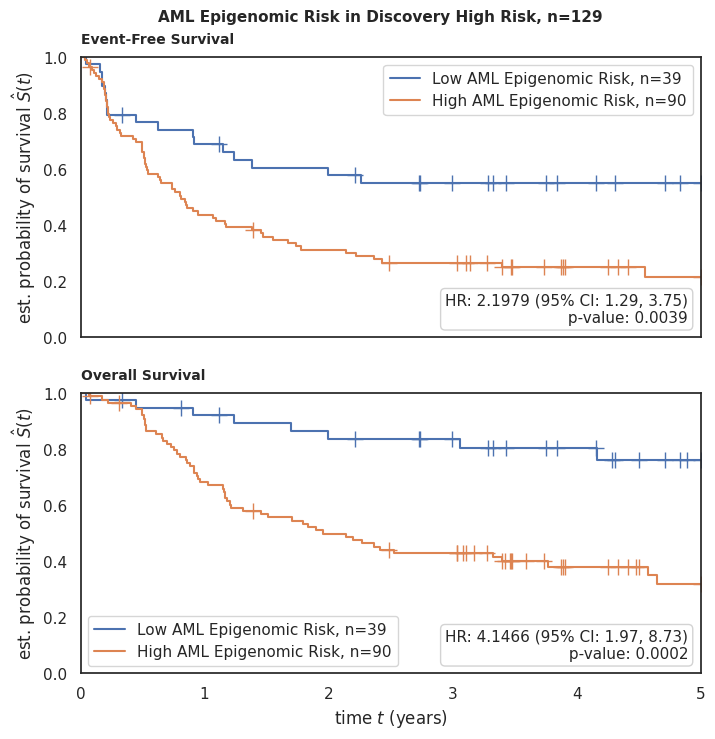

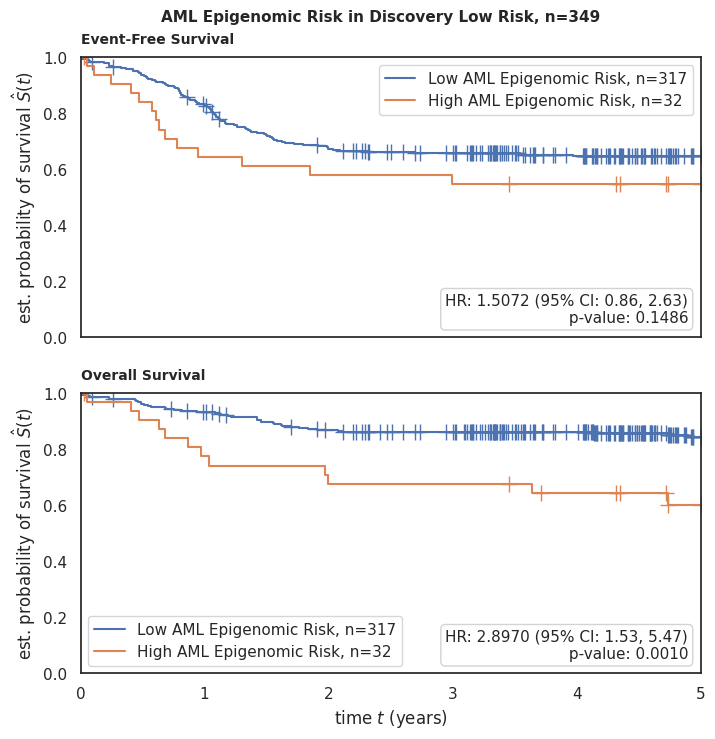

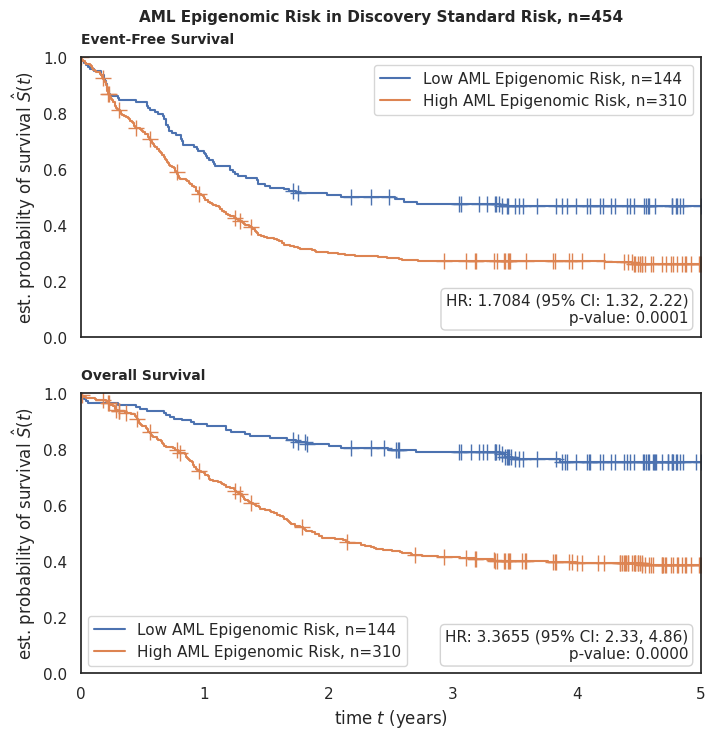

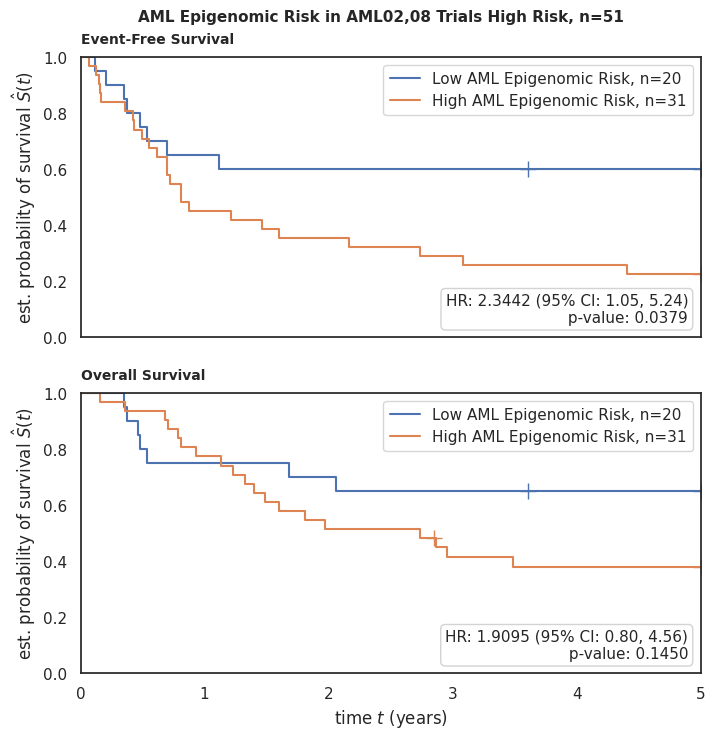

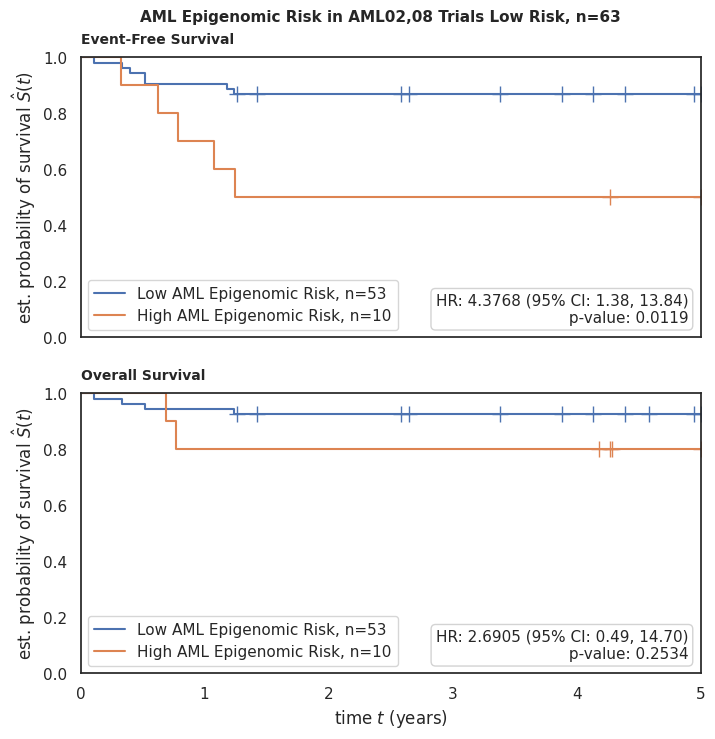

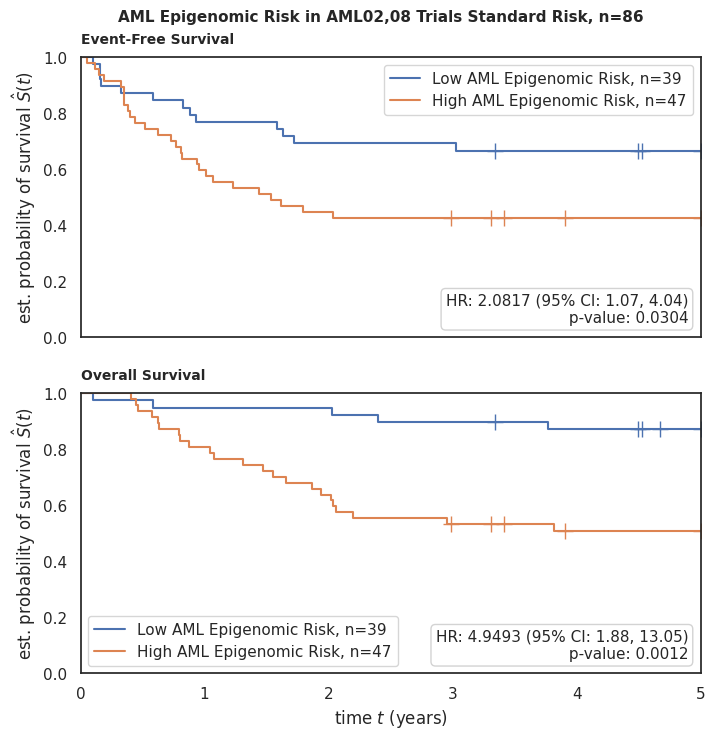

In [12]:
for dataset, trial in zip([df_px2, df_test], ['Discovery', 'AML02,08 Trials']):

    risk_groups = ['High Risk', 'Low Risk', 'Standard Risk']
    for risk_group in risk_groups:
        draw_kaplan_meier(
            model_name=model_name2,
            df=dataset[dataset['Risk Group'] == risk_group],
            save_plot=False,
            save_survival_table=False,
            add_risk_counts=False,
            trialname=f'{trial} {risk_group}',
            figsize=(8, 8))


38CpG-AMLsignature

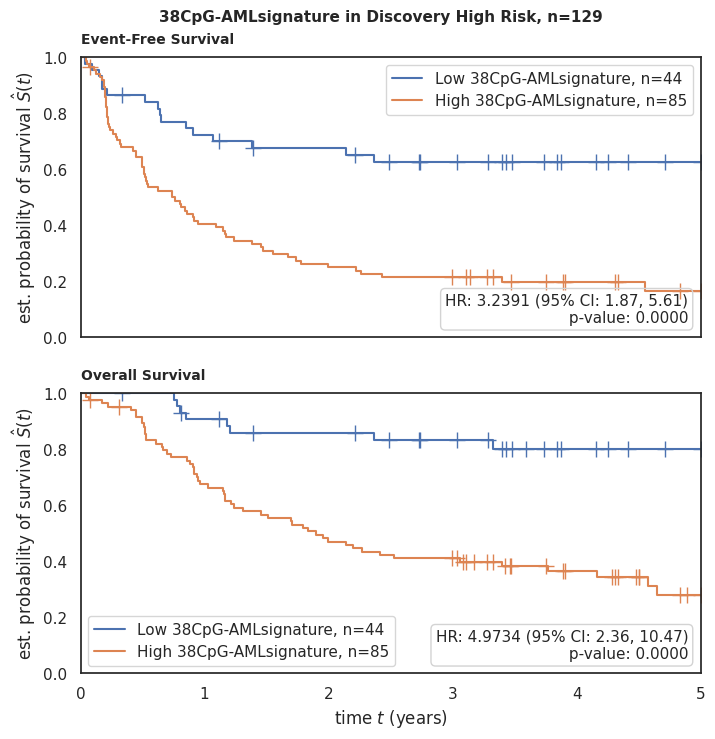

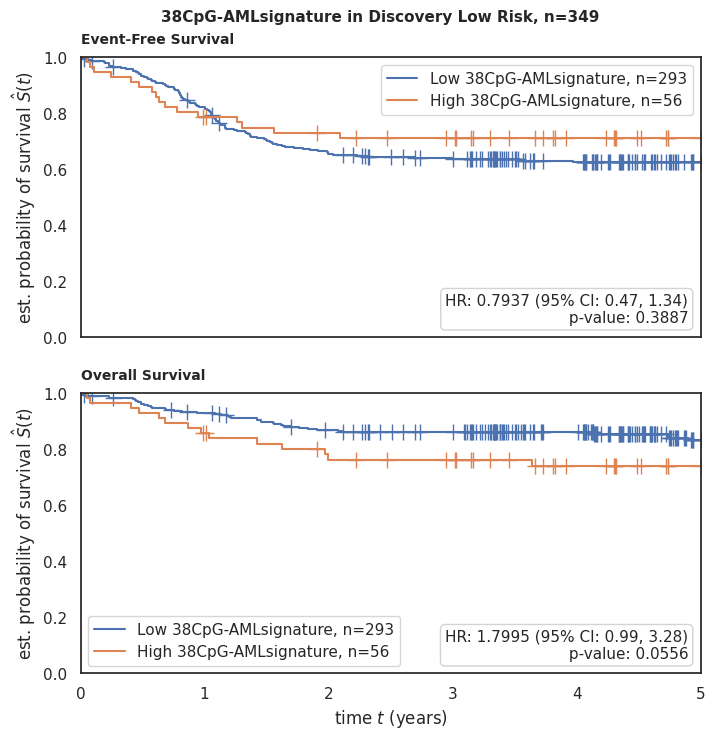

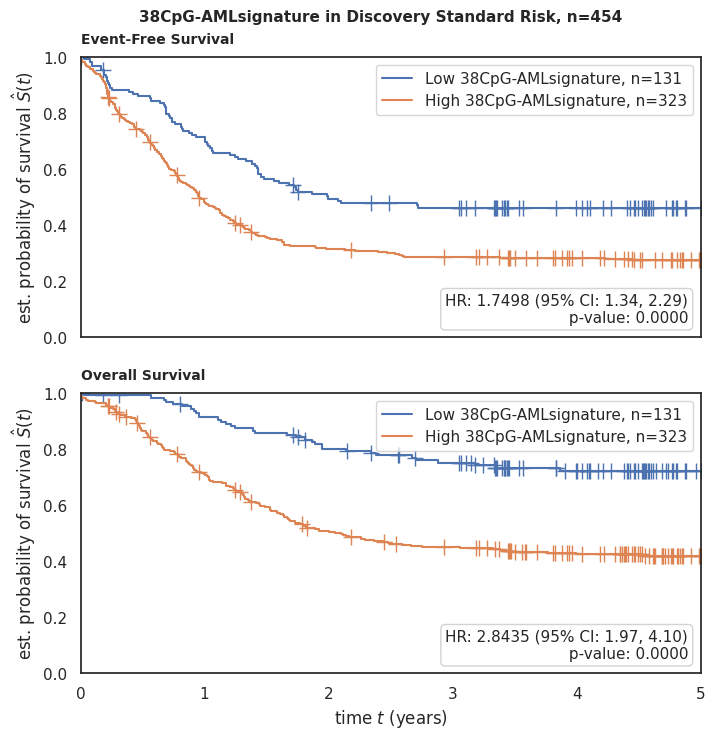

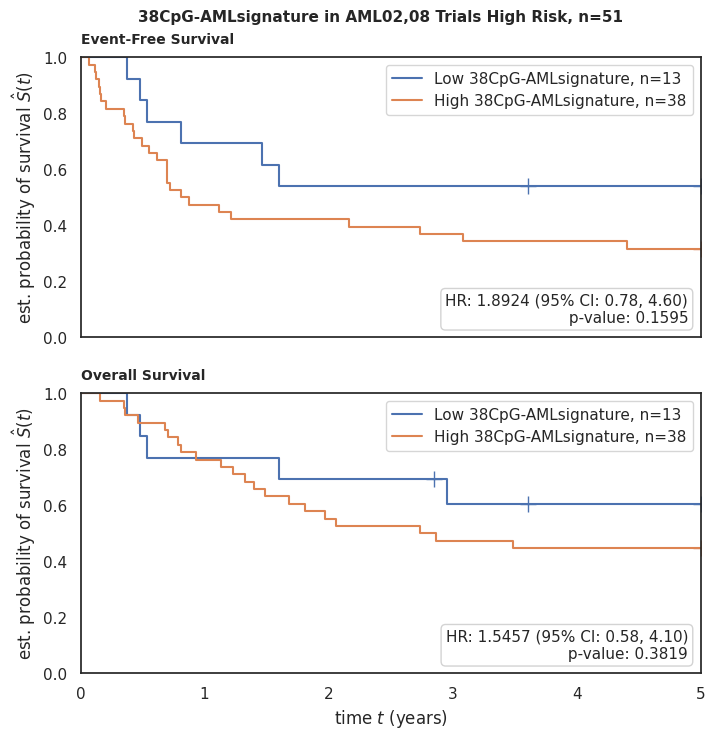

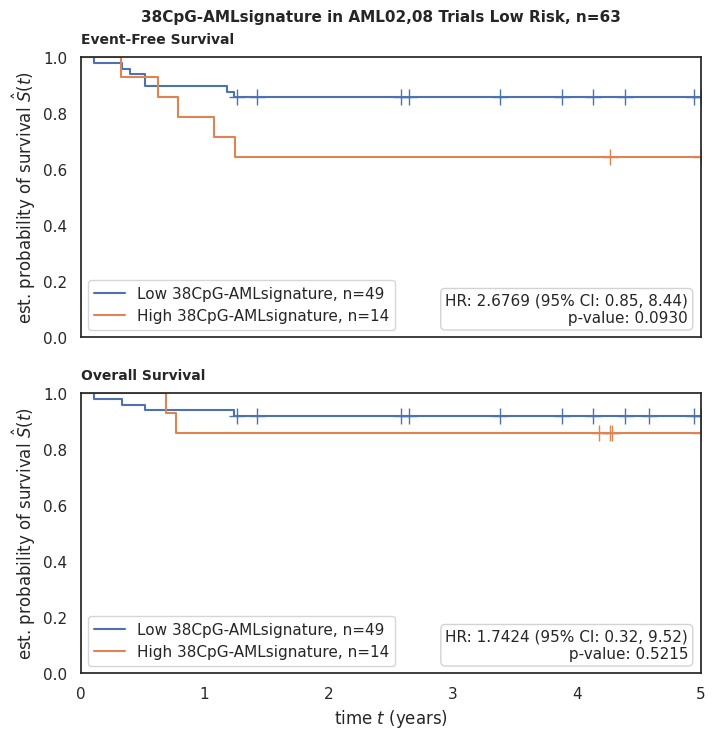

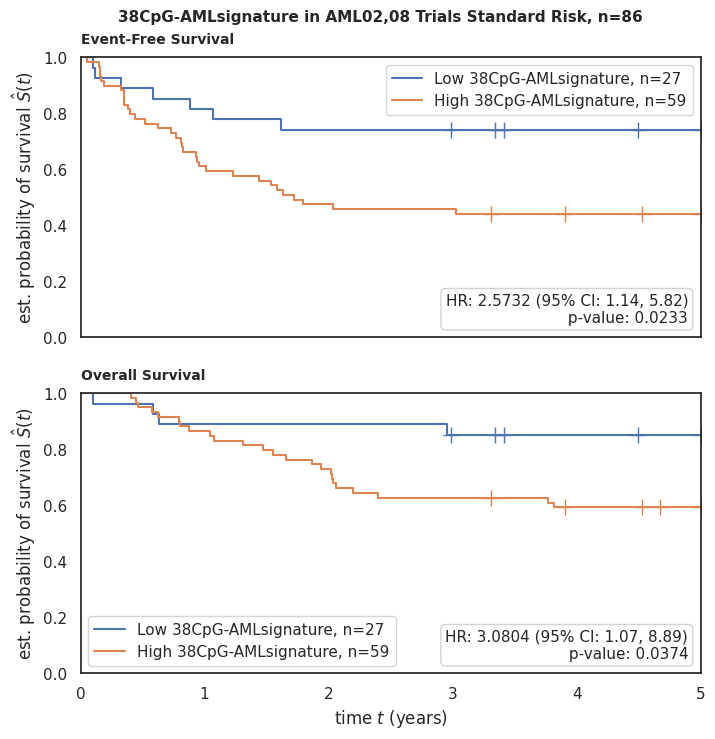

In [13]:
for dataset, trial in zip([df_px2, df_test], ['Discovery', 'AML02,08 Trials']):

    risk_groups = ['High Risk', 'Low Risk', 'Standard Risk']
    for risk_group in risk_groups:
        draw_kaplan_meier(
            model_name= model_name3,
            df=dataset[dataset['Risk Group'] == risk_group],
            save_plot=False,
            save_survival_table=False,
            add_risk_counts=False,
            trialname=f'{trial} {risk_group}',
            figsize=(8, 8))

### Per risk group (AAML1831 COG)

AML Epigenomic Risk

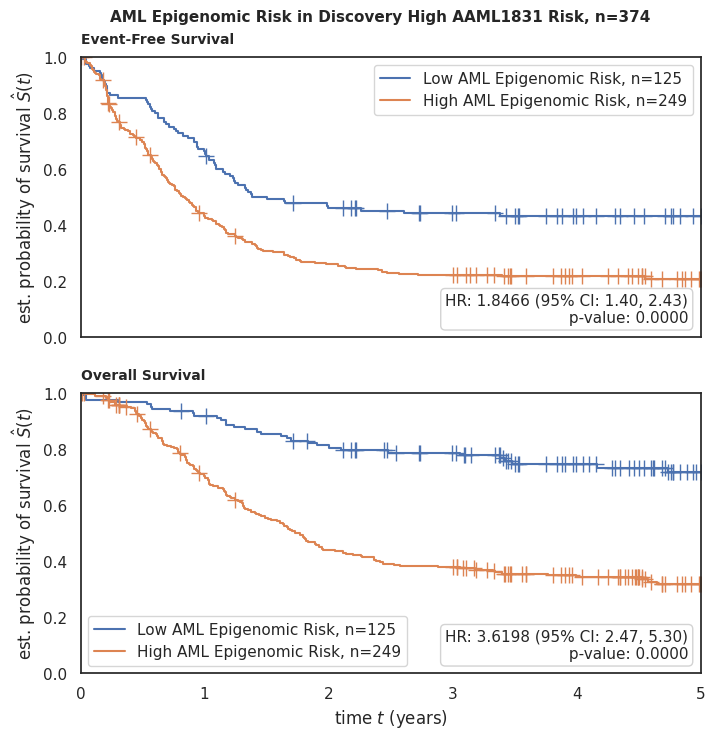

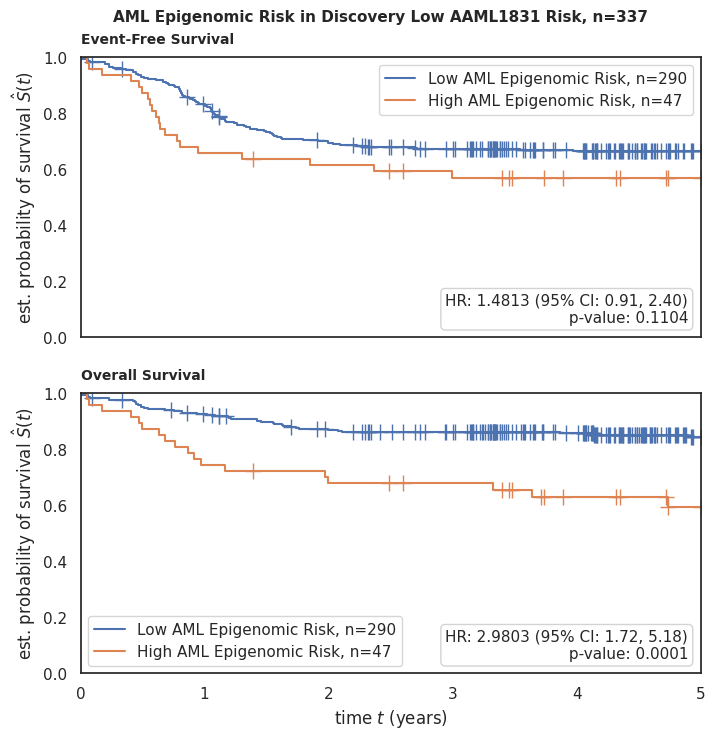

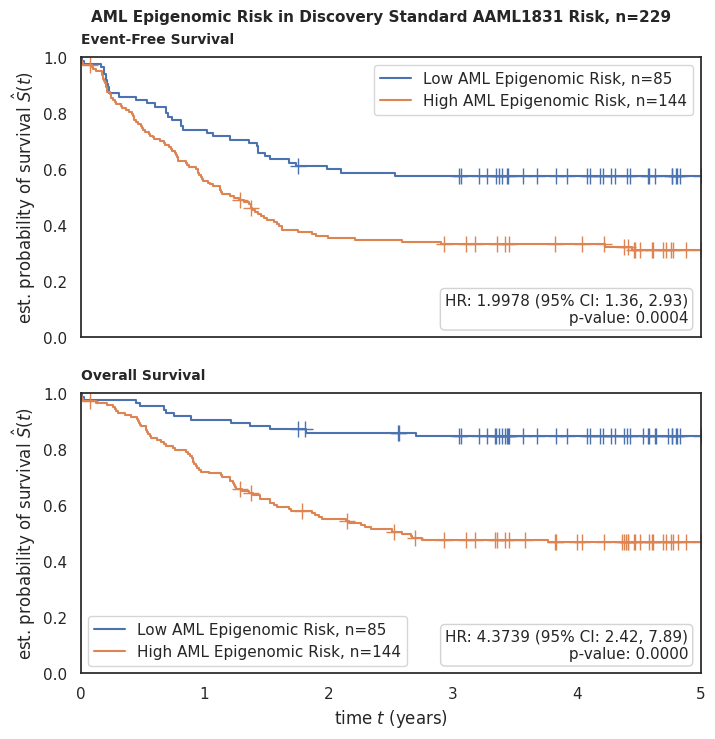

In [14]:
for dataset, trial in zip([df_px2],['Discovery']):

    risk_groups = ['High', 'Low', 'Standard']
    for risk_group in risk_groups:
        draw_kaplan_meier(
            model_name=model_name2,
            df=dataset[dataset['Risk Group AAML1831'] == risk_group],
            save_plot=False,
            save_survival_table=False,
            add_risk_counts=False,
            trialname=f'{trial} {risk_group} AAML1831 Risk',
            figsize=(8, 8))


38CpG-AMLsignature

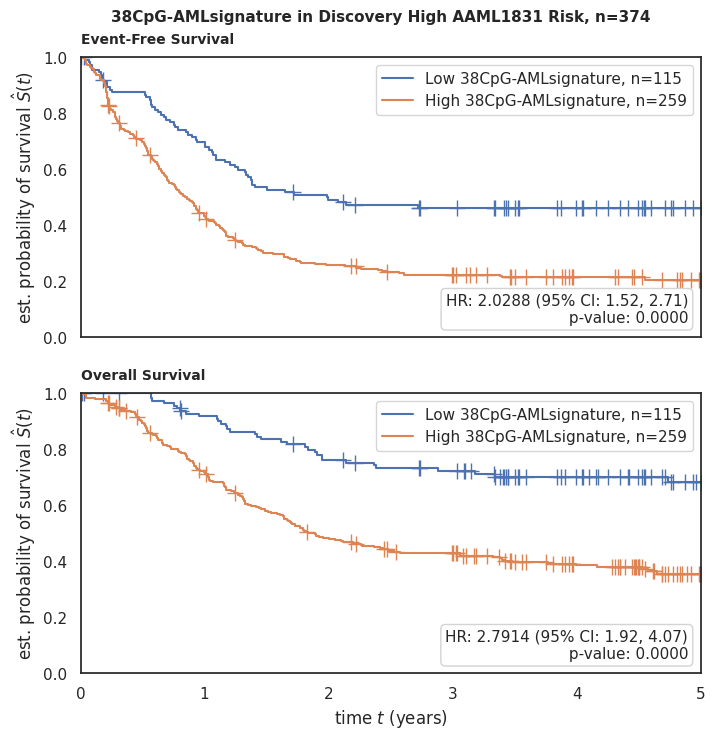

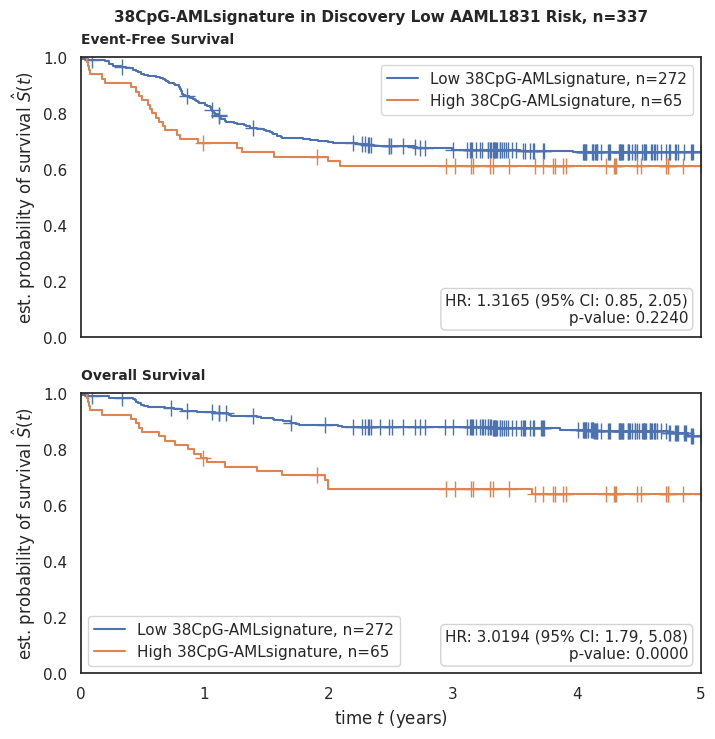

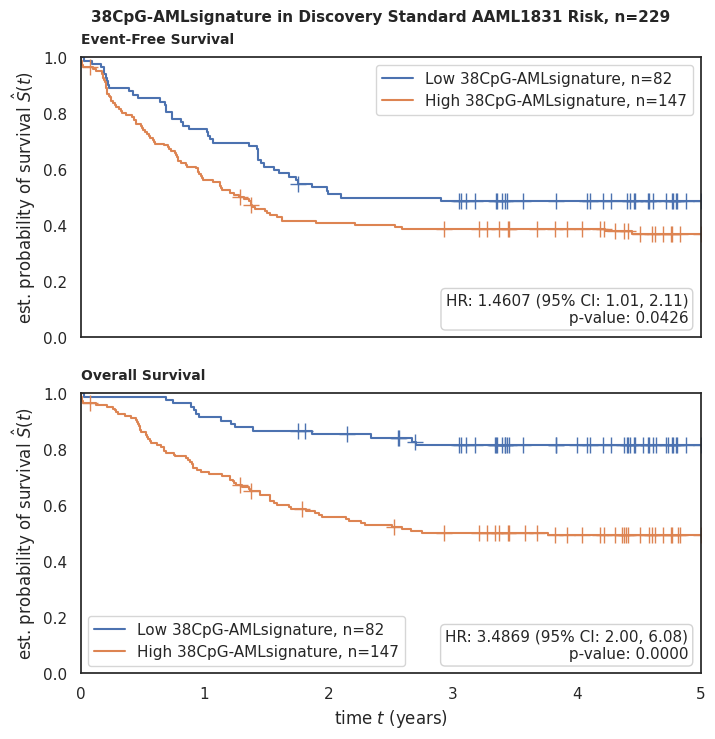

In [15]:
for dataset, trial in zip([df_px2],['Discovery']):

    risk_groups = ['High', 'Low', 'Standard']
    for risk_group in risk_groups:
        draw_kaplan_meier(
            model_name=model_name3,
            df=dataset[dataset['Risk Group AAML1831'] == risk_group],
            save_plot=False,
            save_survival_table=False,
            add_risk_counts=False,
            trialname=f'{trial} {risk_group} AAML1831 Risk',
            figsize=(8, 8))

## Forest Plots

### With MRD 1 and BM blast (%)

AML Epigenomic Risk

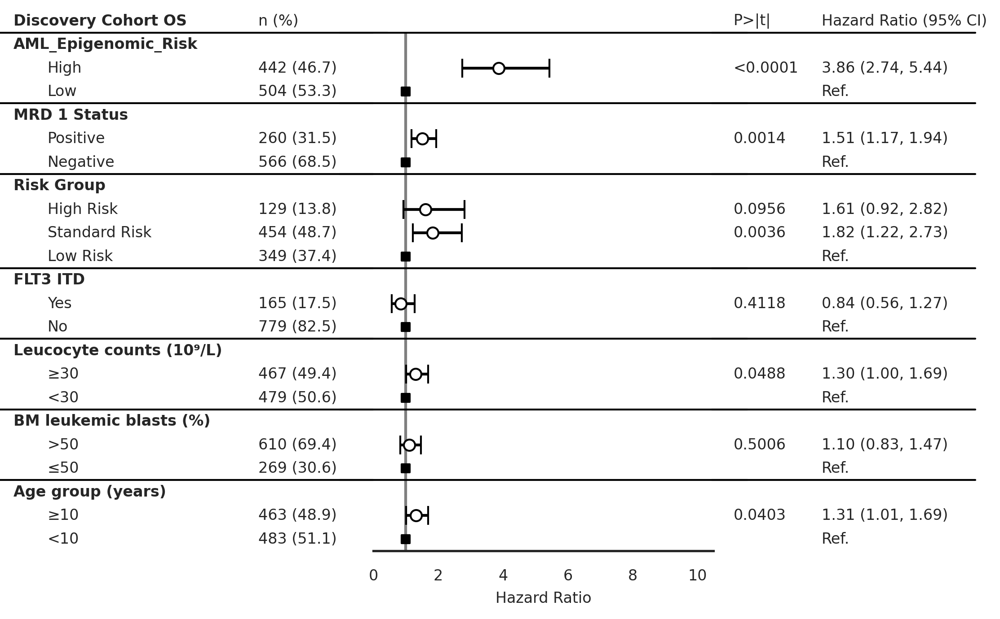

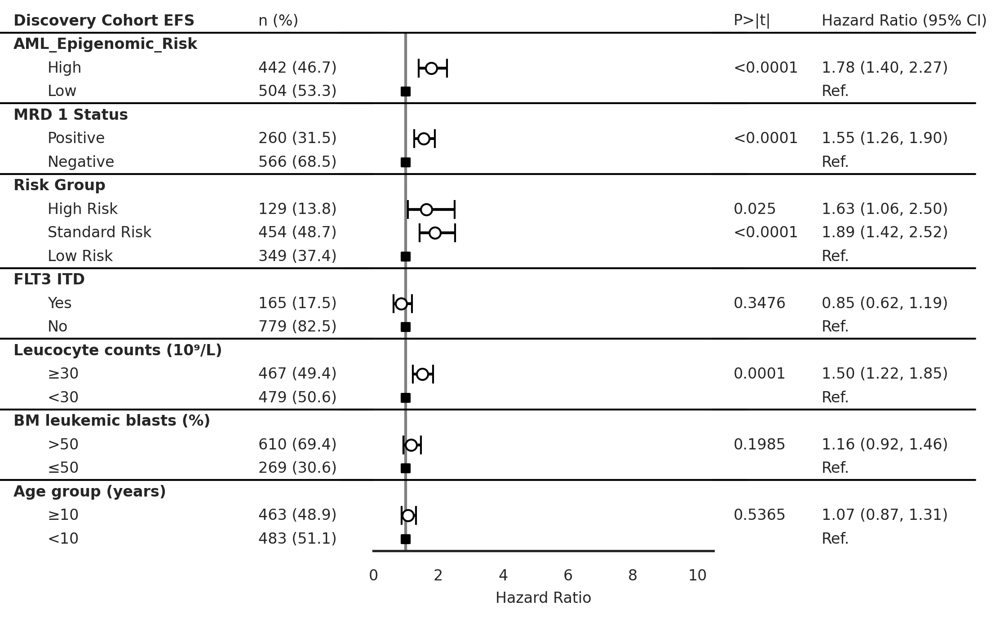

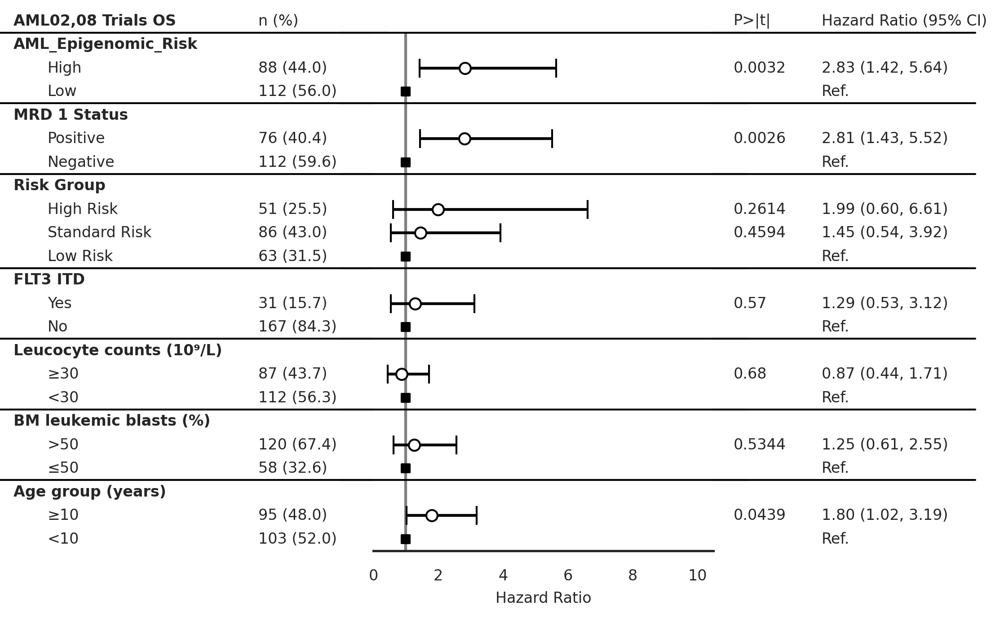

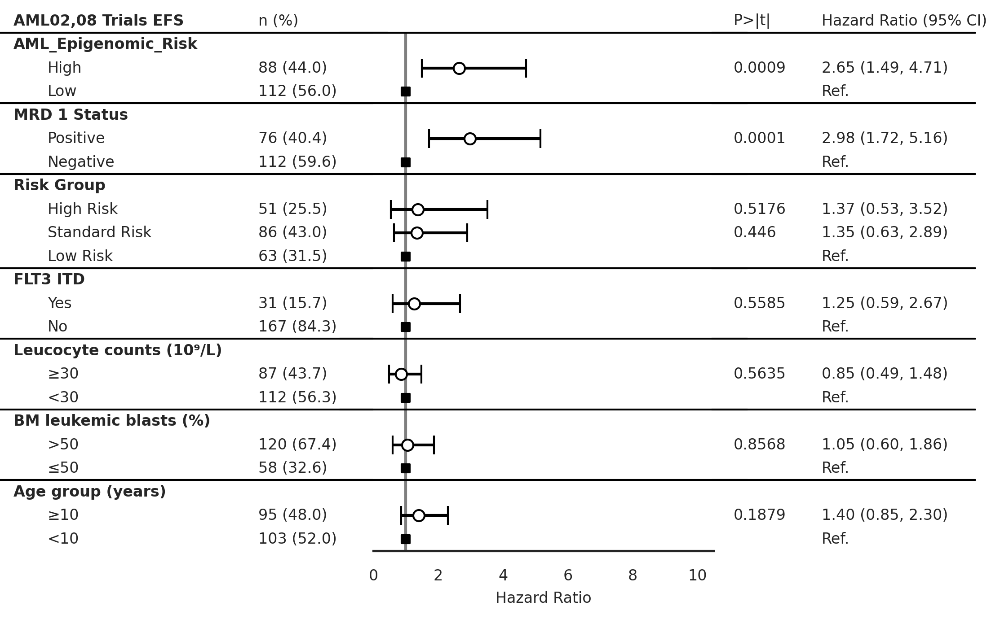

In [16]:
for dataset, trial in zip([df_px2, df_test], ['Discovery Cohort', 'AML02,08 Trials']):
    
    df_ = dataset.copy()
    df_['BM leukemic blasts (%)'] = pd.cut(df_['BM leukemic blasts (%)'], bins=[0,50,100], labels=['≤50', '>50'])
    df_['AML_Epigenomic_Risk'] = df_[model_name2]
    df_['AMLsignature_38CpG'] = df_[model_name3]
    df_['os_time_5y'] = df_['os.time at 5y']
    df_['os_evnt_5y'] = df_['os.evnt at 5y']
    df_['efs_time_5y'] = df_['efs.time at 5y']
    df_['efs_evnt_5y'] = df_['efs.evnt at 5y']

    draw_forest_plot(time='os_time_5y',
                        event='os_evnt_5y',
                        df=df_,
                        trialname=trial,
                        model_name='AML_Epigenomic_Risk',
                        save_plot=False)

    draw_forest_plot(time='efs_time_5y',
                        event='efs_evnt_5y',
                        df=df_,
                        trialname=trial,
                        model_name='AML_Epigenomic_Risk',
                        save_plot=False)


38CpG-AMLsignature

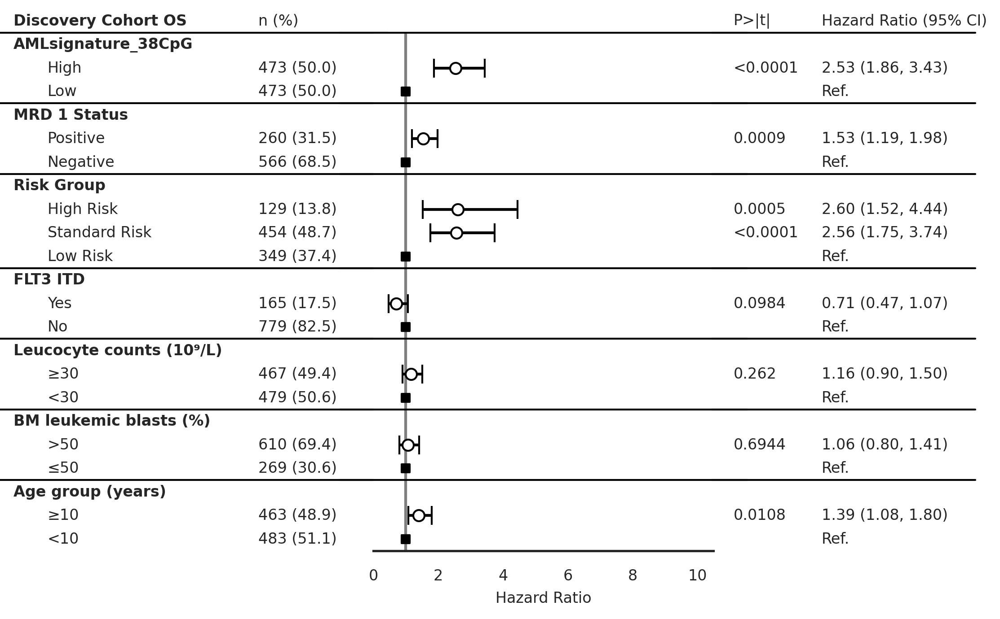

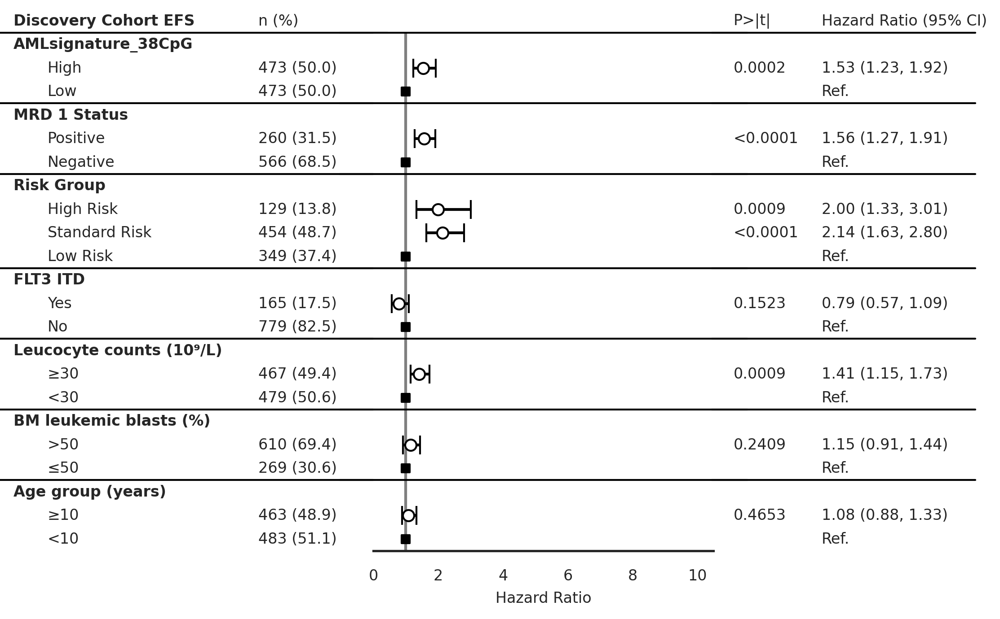

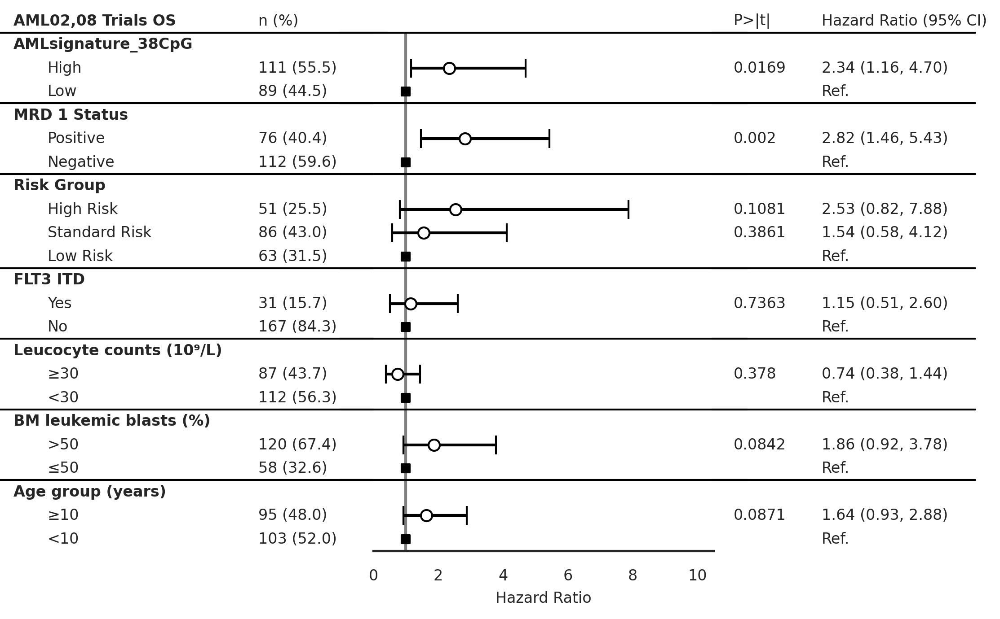

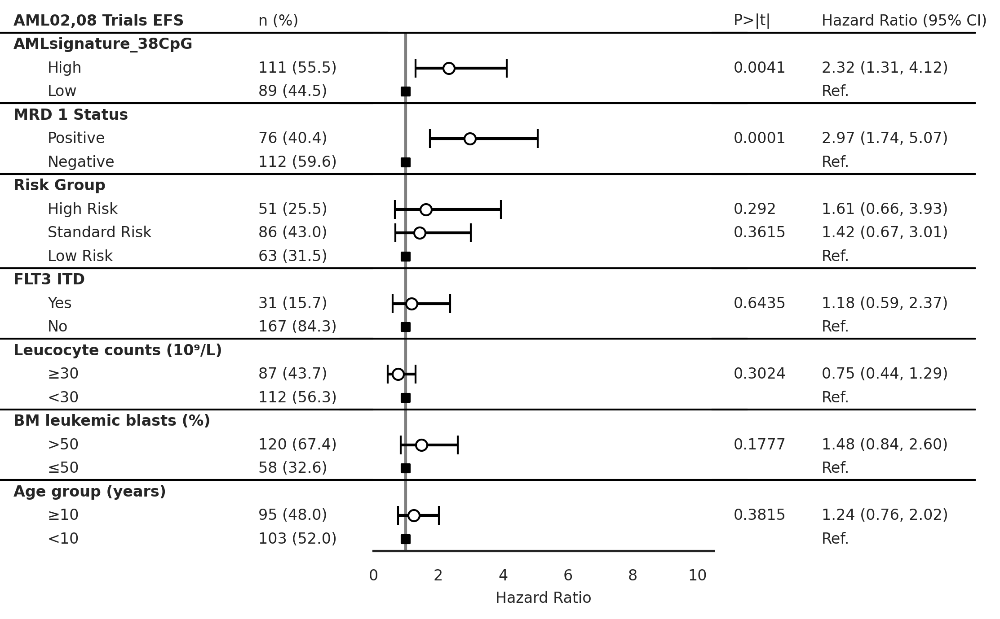

In [17]:
for dataset, trial in zip([df_px2, df_test], ['Discovery Cohort', 'AML02,08 Trials']):

    df_ = dataset.copy()
    df_['BM leukemic blasts (%)'] = pd.cut(df_['BM leukemic blasts (%)'], bins=[0,50,100], labels=['≤50', '>50'])
    df_['AML_Epigenomic_Risk'] = df_[model_name2]
    df_['AMLsignature_38CpG'] = df_[model_name3]
    df_['os_time_5y'] = df_['os.time at 5y']
    df_['os_evnt_5y'] = df_['os.evnt at 5y']
    df_['efs_time_5y'] = df_['efs.time at 5y']
    df_['efs_evnt_5y'] = df_['efs.evnt at 5y']


    draw_forest_plot(time='os_time_5y',
                        event='os_evnt_5y',
                        df=df_,
                        trialname=trial,
                        model_name='AMLsignature_38CpG',
                        save_plot=False)

    draw_forest_plot(time='efs_time_5y',
                        event='efs_evnt_5y',
                        df=df_,
                        trialname=trial,
                        model_name='AMLsignature_38CpG',
                        save_plot=False)

## ROC AUC performance

### Diagnostic Model

In [18]:
def process_dataset_for_multiclass_auc(df):
    features = [
        'P(AML with CBFA2T3::GLIS2)',
        'P(AML with ETV6 fusion)',
        'P(AML with NUP98-fusion)',
        'P(AML with inv(16); t(16;16); CBFB::MYH11)',
        'P(AML with inv(3); t(3;3); MECOM-r)',
        'P(AML with mutated CEBPA)',
        'P(AML with mutated NPM1)',
        'P(AML with t(16;21); FUS::ERG)',
        'P(AML with t(1;22); RBM15::MKL1)',
        'P(AML with t(6;9); DEK::NUP214)',
        'P(AML with t(8;16); KAT6A::CREBBP)',
        'P(AML with t(8;21); RUNX1::RUNX1T1)',
        'P(AML with t(v;11q23); KMT2A-r)',
        'P(APL with t(15;17); PML::RARA)',
        'P(B-ALL dic(9;20))',
        'P(B-ALL with hyperdiploidy)',
        'P(B-ALL with hypodiploidy)',
        'P(B-ALL with iAMP21)',
        'P(B-ALL with t(12;21); ETV6::RUNX1)',
        'P(B-ALL with t(1;19); TCF3::PBX1)',
        'P(B-ALL with t(9;22); BCR::ABL1)',
        'P(B-ALL with t(v;11q23); KMT2A-r)',
        'P(MDS-related; secondary myeloid)',
        'P(MPAL B-Lymphoblastic/Myeloid)',
        'P(MPAL T-Lymphoblastic/Myeloid)',
        'P(MPAL with t(v;11q23.3)/KMT2A-r)',
        'P(Otherwise-Normal Control)',
        'P(T-ALL NOS)'
    ]

    available_features = [feature for feature in features if feature in df.columns]

    df_dx_dummies = pd.get_dummies(df['WHO 2022 Diagnosis']).astype(int)
    df_features = df.loc[:, available_features]
    df_dx_auc = pd.concat([df_features, df_dx_dummies], axis=1)

    return df_dx_auc, df_dx_dummies


df_test2 = df_test[~df_test['WHO 2022 Diagnosis'].isna()]

df_dx_auc_train, df_dx_dummies_train = process_dataset_for_multiclass_auc(df_dx)
df_dx_auc_test, df_dx_dummies_test = process_dataset_for_multiclass_auc(df_test2)

p1 = plot_multiclass_roc_auc(df_dx_auc_train, df_dx_dummies_train.columns, title='Discovery Cohort', height=900, width=400, fontsize='9pt')
p2 = plot_multiclass_roc_auc(df_dx_auc_test, df_dx_dummies_test.columns, title='AML02,08 Trials', height=900, width=400, fontsize='9pt')

# Create a gridplot
p = gridplot([[p1, p2]], toolbar_location='above')

show(p)

### Prognostic models

#### Discovery

In [19]:
def process_dataframes(df, model_name2, model_name3):

    df_cat = df[['os.evnt at 5y', model_name2, model_name3]]
    df_cont = df[['os.evnt at 5y', '38CpG-HazardScore', 'P(Death) at 5y']]

    df_cont = df_cont.rename(columns={
        'P(Death) at 5y': 'AML Epigenomic Risk (PaCMAP-LGBM)',
        '38CpG-HazardScore': '38CpG-AMLsignature (EWAS-CoxPH)'
    })

    df_cat = df_cat.rename(columns={
        model_name2: model_name2 + ' (PaCMAP-LGBM)',
        model_name3: model_name3 + ' (EWAS-CoxPH)'
    })

    return df_cat, df_cont

df_cat, df_cont = process_dataframes(df_px2, model_name2, model_name3)

risk = df_px2[['Risk Group AAML1831','Risk Group']]

low_high_dict = {'Low': 0, 'Low Risk': 0,
                'Standard':0.5, 'Standard Risk': 0.5,
                'High': 1, 'High Risk': 1}

risk['Risk Group'] = risk['Risk Group'].map(low_high_dict)
risk['Risk Group AAML1831'] = risk['Risk Group AAML1831'].map(low_high_dict)

df_cat['AML Epigenomic Risk (PaCMAP-LGBM)'] = df_cat['AML Epigenomic Risk (PaCMAP-LGBM)'].map(low_high_dict)
df_cat['38CpG-AMLsignature (EWAS-CoxPH)'] = df_cat['38CpG-AMLsignature (EWAS-CoxPH)'].map(low_high_dict)

df_cont_risk = df_cont.join(risk)
df_cat_risk = df_cat.join(risk)

# fill missing values in 'Risk Group AAML1831' with values from 'Risk Group'
df_cont_risk['Risk Group AAML1831'] = df_cont_risk['Risk Group AAML1831'].fillna(df_cont_risk['Risk Group'])
df_cat_risk['Risk Group AAML1831'] = df_cat_risk['Risk Group AAML1831'].fillna(df_cat_risk['Risk Group'])

df_cont_risk = df_cont_risk.fillna(0.5)
df_cat_risk = df_cat_risk.fillna(0.5)

p1 = plot_roc_auc(df_cont_risk, 'os.evnt at 5y',title= 'Discovery: prob. of death at 5y')
p2 = plot_roc_auc(df_cat_risk, 'os.evnt at 5y',title= 'Discovery: high-low risk')

# Create a gridplot
p = gridplot([[p1, p2]], toolbar_location='above')

show(p)

#### AML02,08 trials

In [20]:
df_cat, df_cont = process_dataframes(df_test, model_name2, model_name3)

risk = df_test[['Risk Group']]
risk['Risk Group'] = risk['Risk Group'].map(low_high_dict)

df_cat['AML Epigenomic Risk (PaCMAP-LGBM)'] = df_cat['AML Epigenomic Risk (PaCMAP-LGBM)'].map(low_high_dict)
df_cat['38CpG-AMLsignature (EWAS-CoxPH)'] = df_cat['38CpG-AMLsignature (EWAS-CoxPH)'].map(low_high_dict)

df_cont_risk_test = df_cont.join(risk)
df_cat_risk_test = df_cat.join(risk)

# Rename `Risk Group` to `Risk Group AML02,08`
df_cont_risk_test = df_cont_risk_test.rename(columns={'Risk Group':'Risk Group AML02-08'})
df_cat_risk_test = df_cat_risk_test.rename(columns={'Risk Group':'Risk Group AML02-08'})

p1 = plot_roc_auc(df_cont_risk_test, 'os.evnt at 5y',title= 'AML02,08 trials: prob. of death at 5y')
p2 = plot_roc_auc(df_cat_risk_test, 'os.evnt at 5y',title= 'AML02,08 trials: high-low risk')

# Create a gridplot
p = gridplot([[p1, p2]], toolbar_location='above')

show(p)


#### NOPHO AML trial

In [21]:
# dropna from 'AML Epigenomic Risk_int' and '38CpG-AMLsignature_int'
nopho_aml2 = nopho_aml.dropna(subset=[model_name2])
df_cat_test2, df_cont_test2 = process_dataframes(nopho_aml2, model_name2, model_name3)

risk = df_test[['Risk Group']]
risk['Risk Group'] = risk['Risk Group'].map(low_high_dict)

df_cat_test2['AML Epigenomic Risk (PaCMAP-LGBM)'] = df_cat_test2['AML Epigenomic Risk (PaCMAP-LGBM)'].map(low_high_dict)
df_cat_test2['38CpG-AMLsignature (EWAS-CoxPH)'] = df_cat_test2['38CpG-AMLsignature (EWAS-CoxPH)'].map(low_high_dict)

# df_cont_test2_risk_test = df_cont_test2.join(risk)
# df_cat_test2_risk_test = df_cat_test2.join(risk)

# Rename `Risk Group` to `Risk Group AML02,08`
# df_cont_test2_risk_test = df_cont_test2_risk_test.rename(columns={'Risk Group':'Risk Group AML02-08'})
# df_cat_test2_risk_test = df_cat_test2_risk_test.rename(columns={'Risk Group':'Risk Group AML02-08'})

p1 = plot_roc_auc(df_cont_test2, 'os.evnt at 5y',title= 'NOPHO AML trial: prob. of death at 5y')
p2 = plot_roc_auc(df_cat_test2, 'os.evnt at 5y',title= 'NOPHO AML trial: high-low risk')

# Create a gridplot
p = gridplot([[p1, p2]], toolbar_location='above')

show(p)


#### Comparison with previously published models

In [22]:
# import pandas as pd
# from bokeh.layouts import gridplot
# from bokeh.plotting import show

# # Constants
# PATH = "../../Clinical_Data/ACS10.LSC6.ADERS/"
# LOW_HIGH_DICT = {'Low': 0, 'Low Risk': 0, 'Standard': 0.5, 'Standard Risk': 0.5, 'High': 1, 'High Risk': 1}

# # Load Data
# def load_data():
#     df_add1 = pd.read_excel(f"{PATH}AAML03P1_0531_1031_Combined_Clinical Outcomes_VS_09092023.xlsx", index_col=1)
#     df_add1 = df_add1[['Score10SNPs_final', 'SNP_Score.gb']]

#     df_add2 = pd.read_csv(f"{PATH}AML02.AML08.clin.score.MERGE.N389.csv", index_col=0)
#     df_add2 = df_add2[['Score_10SNPs_Points', 'Score_10SNPs_Points.gb']]
#     df_add2 = df_add2.rename(columns={'Score_10SNPs_Points': 'Score10SNPs_final', 'Score_10SNPs_Points.gb': 'SNP_Score.gb'})

#     df_add_acs10 = pd.concat([df_add1, df_add2])

#     df_add_lsc6 = pd.read_excel(f"{PATH}combined_pediatric_clinical_LSC6ASERS5scores_data_Final.xlsx", index_col=1, sheet_name='combined_pediatric_clinical_sco')[['pLSC6', 'pLSC6.grp', 'adeRS5', 'adeRS5.grp', 'LSC6RS5', 'LSC6RS5.4grps']]
#     df_add_lsc6_index = pd.read_excel(f"{PATH}JLamba-AML02-data-2019-02-12_JKL.Francisco.xlsx")[['JL.id.x', 'U133A.Dx.ID']].set_index('U133A.Dx.ID')

#     df_add_lsc6_aml02 = df_add_lsc6.join(df_add_lsc6_index, how='inner').set_index('JL.id.x')
#     df_add_lsc6 = pd.concat([df_add_lsc6, df_add_lsc6_aml02])

#     return df_add_acs10, df_add_lsc6

# # Process Mapping
# def map_scores(df, columns):
#     for col in columns:
#         df[col] = df[col].map({'High': 1, 'Intermediate': 0.5, 'Low': 0})
#     return df

# # Process DataFrames
# def process_dataframes(df, model_name2, model_name3):
#     df_cat = df[['os.evnt at 5y', model_name2, model_name3, 'pLSC6.grp']]
#     df_cont = df[['os.evnt at 5y', '38CpG-HazardScore', 'P(Death) at 5y', 'pLSC6']]

#     df_cont = df_cont.rename(columns={
#         'P(Death) at 5y': 'AML Epigenomic Risk (PaCMAP-LGBM)',
#         '38CpG-HazardScore': '38CpG-AMLsignature (EWAS-CoxPH)'
#     })

#     df_cat = df_cat.rename(columns={
#         model_name2: model_name2 + ' (PaCMAP-LGBM)',
#         model_name3: model_name3 + ' (EWAS-CoxPH)'
#     })

#     return df_cat, df_cont

# # Plot ROC AUC
# def plot_roc(df_cont_risk, df_cat_risk, title1, title2):
#     p1 = plot_roc_auc(df_cont_risk, 'os.evnt at 5y', title=title1)
#     p2 = plot_roc_auc(df_cat_risk, 'os.evnt at 5y', title=title2)
#     p = gridplot([[p1, p2]], toolbar_location='above')
#     show(p)

# # Main Workflow
# df_add_acs10, df_add_lsc6 = load_data()
# df_add = df_px2.join(df_add_acs10, on='Patient_ID').join(df_add_lsc6, on='Patient_ID')
# df_test_add = df_test.join(df_add_acs10, on='Patient_ID').join(df_add_lsc6, on='Patient_ID')

# columns_to_map = ['SNP_Score.gb', 'pLSC6.grp']
# df_add = map_scores(df_add, columns_to_map)
# df_test_add = map_scores(df_test_add, columns_to_map)

# # Process Training Data
# df_cat, df_cont = process_dataframes(df_add, model_name2, model_name3)
# risk = df_px2[['Risk Group']]
# risk['Risk Group'] = risk['Risk Group'].map(LOW_HIGH_DICT)

# # Add Risk Data
# df_cat['AML Epigenomic Risk (PaCMAP-LGBM)'] = df_cat['AML Epigenomic Risk (PaCMAP-LGBM)'].map(LOW_HIGH_DICT)
# df_cat['38CpG-AMLsignature (EWAS-CoxPH)'] = df_cat['38CpG-AMLsignature (EWAS-CoxPH)'].map(LOW_HIGH_DICT)

# df_cont_risk = df_cont.join(risk).dropna()
# df_cat_risk = df_cat.join(risk).dropna()

# df_cat_risk['pLSC6+AML Epigenomic Risk'] = df_cat_risk['AML Epigenomic Risk (PaCMAP-LGBM)'] + df_cat_risk['pLSC6.grp']
# df_cat_risk['pLSC6+38CpG-AMLsignature'] = df_cat_risk['38CpG-AMLsignature (EWAS-CoxPH)'] + df_cat_risk['pLSC6.grp']

# # Plot Training Data ROC AUC
# plot_roc(df_cont_risk, df_cat_risk, 'Continuous (prob. of death at 5y)', 'Categorical (high-low risk)')

# # Process Test Data
# df_cat, df_cont = process_dataframes(df_test_add, model_name2, model_name3)
# risk = df_test[['Risk Group']]
# risk['Risk Group'] = risk['Risk Group'].map(LOW_HIGH_DICT)

# # Add Risk Data to Test Set
# df_cat['AML Epigenomic Risk (PaCMAP-LGBM)'] = df_cat['AML Epigenomic Risk (PaCMAP-LGBM)'].map(LOW_HIGH_DICT)
# df_cat['38CpG-AMLsignature (EWAS-CoxPH)'] = df_cat['38CpG-AMLsignature (EWAS-CoxPH)'].map(LOW_HIGH_DICT)

# df_cont_risk_test = df_cont.join(risk).dropna().rename(columns={'Risk Group': 'Risk Group AML02-08'})
# df_cat_risk_test = df_cat.join(risk).dropna().rename(columns={'Risk Group': 'Risk Group AML02-08'})

# df_cat_risk_test['pLSC6+AML Epigenomic Risk'] = df_cat_risk_test['AML Epigenomic Risk (PaCMAP-LGBM)'] + df_cat_risk_test['pLSC6.grp'] 
# df_cat_risk_test['pLSC6+38CpG-AMLsignature'] = df_cat_risk_test['38CpG-AMLsignature (EWAS-CoxPH)'] + df_cat_risk_test['pLSC6.grp']

# # Plot Test Data ROC AUC
# plot_roc(df_cont_risk_test, df_cat_risk_test, 'Continuous (prob. of death at 5y)', 'Categorical (high-low risk)')


# ### Patient Characteristics ####

# # from tableone import TableOne
# # from datetime import date


# # columns = ['LSC6RS5.4grps']

# # mytable = TableOne(df_add.reset_index(), columns,
# #                         overall=False, missing=True,
# #                         pval=False, pval_adjust=False,
# #                         htest_name=True,dip_test=True,
# #                         tukey_test=True, normal_test=True,
# #                                 groupby=model_name2
# #                                 )

# # mytable.tabulate(tablefmt="html", 
# #                         headers=["","",'Missing',model_name2 + ' High',model_name2 + ' Low']
# #                         )

# # mytable.to_excel('temp1.xlsx')

# # mytable = TableOne(df_test_add.reset_index(), columns,
# #                         overall=False, missing=True,
# #                         pval=False, pval_adjust=False,
# #                         htest_name=True,dip_test=True,
# #                         tukey_test=True, normal_test=True,
# #                                 groupby=model_name2
# #                                 )

# # mytable.tabulate(tablefmt="html", 
# #                         headers=["","",'Missing',model_name2 + ' High',model_name2 + ' Low']
# #                         )

# # mytable.to_excel('temp2.xlsx')

# # mytable = TableOne(df_add.reset_index(), columns,
# #                         overall=False, missing=True,
# #                         pval=False, pval_adjust=False,
# #                         htest_name=True,dip_test=True,
# #                         tukey_test=True, normal_test=True,
# #                                 groupby=model_name3
# #                                 )

# # mytable.tabulate(tablefmt="html", 
# #                         headers=["","",'Missing',model_name2 + ' High',model_name2 + ' Low']
# #                         )

# # mytable.to_excel('temp3.xlsx')

# # mytable = TableOne(df_test_add.reset_index(), columns,
# #                         overall=False, missing=True,
# #                         pval=False, pval_adjust=False,
# #                         htest_name=True,dip_test=True,
# #                         tukey_test=True, normal_test=True,
# #                                 groupby=model_name3
# #                                 )

# # mytable.tabulate(tablefmt="html", 
# #                         headers=["","",'Missing',model_name2 + ' High',model_name2 + ' Low']
# #                         )

# # mytable.to_excel('temp4.xlsx')

# #### KAPLAN MEIER ####

# # Remove the missing values from df_add['pLSC6.grp'] and replace 0 with "Low" and 1 with "High"
# df_add2 = df_add.dropna(subset=['pLSC6.grp'])
# df_add2['pLSC6.grp'] = df_add2['pLSC6.grp'].replace({0: 'Low pLSC6', 1: 'High pLSC6'})
# # df_add2[model_name2] = df_add2[model_name2].replace({'Low':'Low AML Epigenomic Risk','High': 'High AML Epigenomic Risk'})
# # df_add2[model_name3] = df_add2[model_name3].replace({'Low':'Low 38CpG-AMLsignature','High': 'High 38CpG-AMLsignature'})

# # Now do the same for df_test_add
# df_test_add2 = df_test_add.dropna(subset=['pLSC6.grp'])
# df_test_add2['pLSC6.grp'] = df_test_add2['pLSC6.grp'].replace({0: 'Low pLSC6', 1: 'High pLSC6'})
# # df_test_add2[model_name2] = df_test_add2[model_name2].replace({'Low':'Low AML Epigenomic Risk','High': 'High AML Epigenomic Risk'})
# # df_test_add2[model_name3] = df_test_add2[model_name3].replace({'Low':'Low 38CpG-AMLsignature','High': 'High 38CpG-AMLsignature'})

# from datetime import date
# # Save df_add and df_test_add to excel
# # df_add2.to_excel('COG_prognostic_models_merged_' + str(date.today()) +'.xlsx')
# # df_test_add2.to_excel('StJude_prognostic_models_merged_' + str(date.today()) +'.xlsx')

# for dataset, trial in zip([df_add2, df_test_add2], ['COG trials', 'St Jude trials']):

#     risk_groups = ['High pLSC6', 'Low pLSC6']
#     for risk_group in risk_groups:
#         draw_kaplan_meier(
#             model_name=model_name2,
#             df=dataset[dataset['pLSC6.grp'] == risk_group],
#             save_plot=False,
#             save_survival_table=False,
#             add_risk_counts=False,
#             trialname=f'{trial} {risk_group}',
#             figsize=(8, 8))
        
# for dataset, trial in zip([df_add2, df_test_add2], ['COG trials', 'St Jude trials']):

#     risk_groups = ['High pLSC6', 'Low pLSC6']
#     for risk_group in risk_groups:
#         draw_kaplan_meier(
#             model_name=model_name3,
#             df=dataset[dataset['pLSC6.grp'] == risk_group],
#             save_plot=False,
#             save_survival_table=False,
#             add_risk_counts=False,
#             trialname=f'{trial} {risk_group}',
#             figsize=(8, 8))



```{important}
pLSC6 and adeRS5 training set is our test set, and vice-versa. Combining LSC6RS5 with AML Epigenomic Risk makes both datasets training sets, so a third cohort is needed to test the combined model.
```

## Pearson Correlation

### Discovery

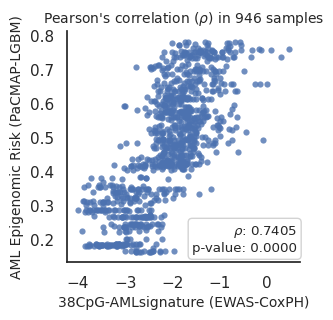

,38CpG-AMLsignature (EWAS-CoxPH),AML Epigenomic Risk (PaCMAP-LGBM),Risk Group AAML1831,Risk Group
38CpG-AMLsignature (EWAS-CoxPH),1.00,0.74,0.50,0.54
AML Epigenomic Risk (PaCMAP-LGBM),0.74,1.00,0.53,0.59
Risk Group AAML1831,0.50,0.53,1.00,0.62
Risk Group,0.54,0.59,0.62,1.00


In [23]:
draw_scatter_pearson(df=df_cont_risk,x=model_name3 + ' (EWAS-CoxPH)', y=model_name2 + ' (PaCMAP-LGBM)',s=20)

df_cont_risk.iloc[:,1:].corr().round(2)

### AML02,08 Trials

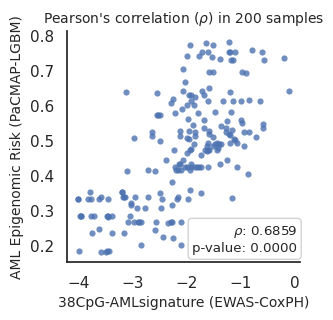

,38CpG-AMLsignature (EWAS-CoxPH),AML Epigenomic Risk (PaCMAP-LGBM),Risk Group AML02-08
38CpG-AMLsignature (EWAS-CoxPH),1.00,0.69,0.46
AML Epigenomic Risk (PaCMAP-LGBM),0.69,1.00,0.51
Risk Group AML02-08,0.46,0.51,1.00


In [24]:
draw_scatter_pearson(df=df_cont_risk_test,x=model_name3 + ' (EWAS-CoxPH)', y=model_name2 + ' (PaCMAP-LGBM)',s=20)

df_cont_risk_test.iloc[:,1:].corr().round(2)

### NOPHO AML trial

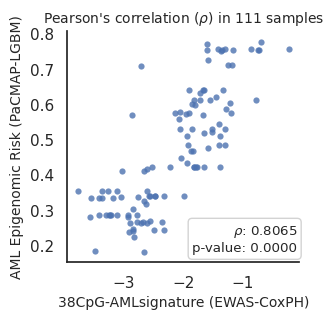

,38CpG-AMLsignature (EWAS-CoxPH),AML Epigenomic Risk (PaCMAP-LGBM)
38CpG-AMLsignature (EWAS-CoxPH),1.00,0.81
AML Epigenomic Risk (PaCMAP-LGBM),0.81,1.00


In [25]:
draw_scatter_pearson(df=df_cont_test2,x=model_name3 + ' (EWAS-CoxPH)', y=model_name2 + ' (PaCMAP-LGBM)',s=20)

df_cont_test2.iloc[:,1:].corr().round(2)

## Sankey plots

```{note}
Sankey plots below compare the distribution of categories. The width of the lines is proportional to the number of patients in each group.
```

### Samples with annotated diagnosis info

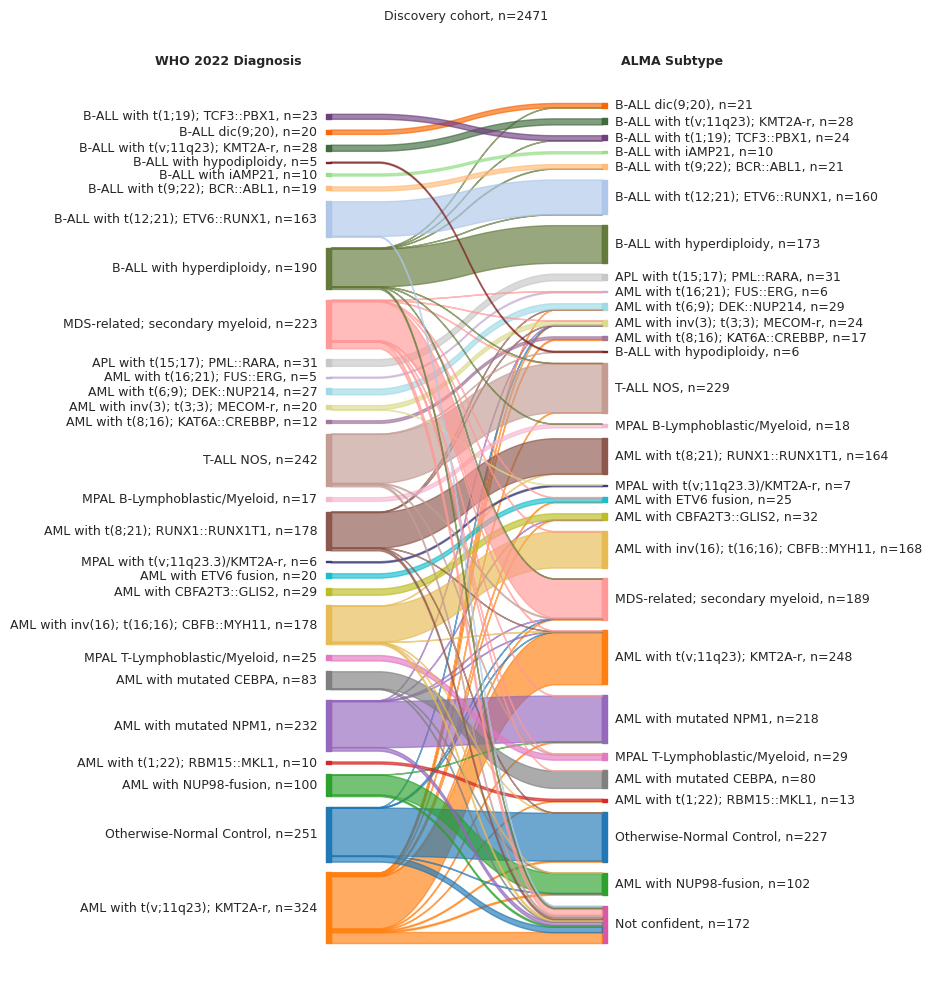

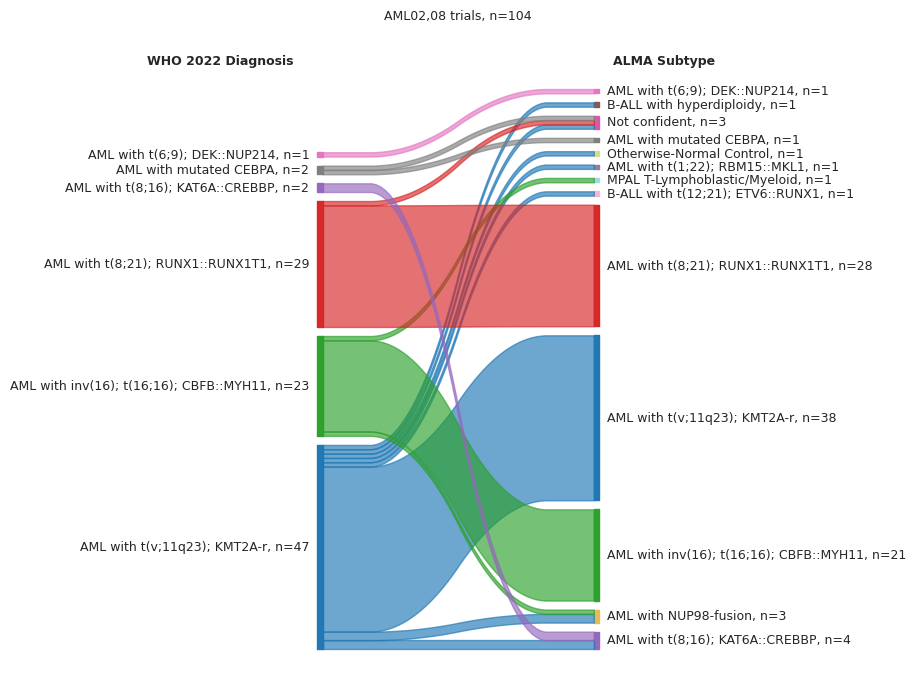

In [26]:
colors = get_custom_color_palette()


draw_sankey_plot(df_dx, 'WHO 2022 Diagnosis', model_name1, colors,
                 title='Discovery cohort', fig_size=(4, 12),
                 fontsize=9, nan_action='drop1')

draw_sankey_plot(df_test, 'WHO 2022 Diagnosis', model_name1, colors,
                 title= 'AML02,08 trials',fig_size=(4, 8),
                 fontsize=9, nan_action='drop1')

### Predictions in samples for which no WHO 22 Dx data was available

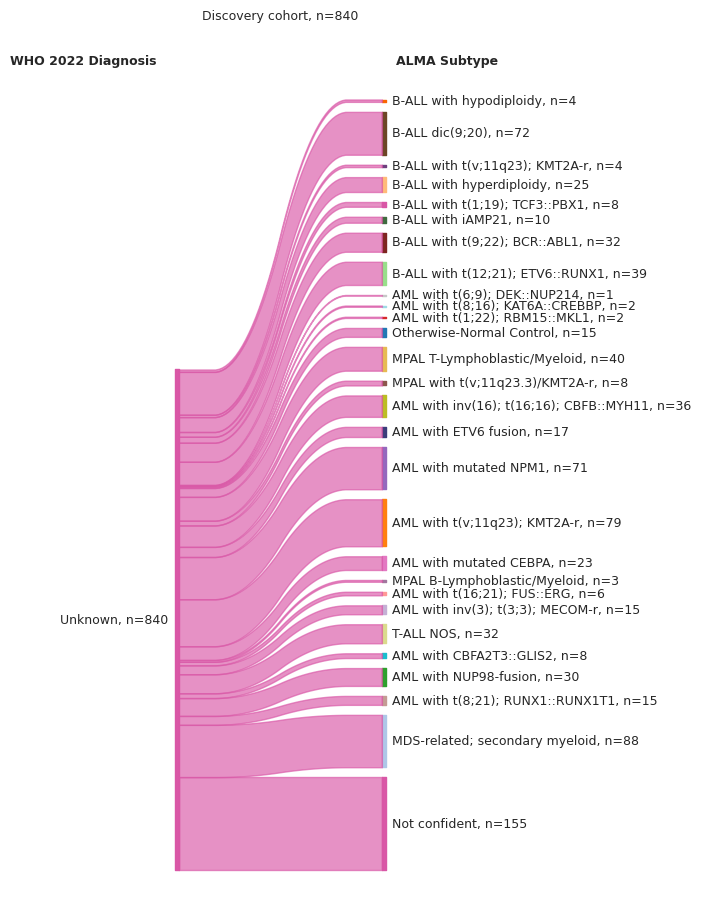

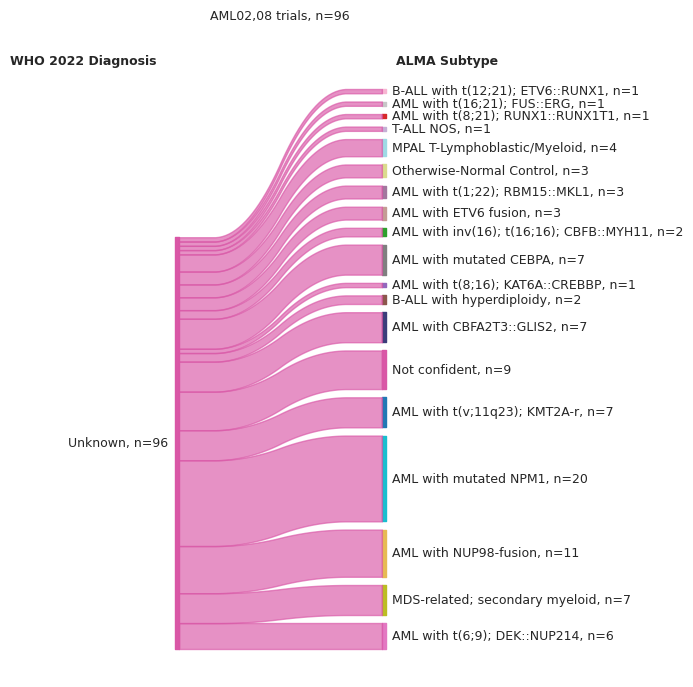

In [27]:
draw_sankey_plot(df_train, 'WHO 2022 Diagnosis', model_name1, colors,
                 title='Discovery cohort', fig_size=(3, 11),
                 fontsize=9, nan_action='keep-only')

draw_sankey_plot(df_test, 'WHO 2022 Diagnosis', model_name1, colors,
                 title= 'AML02,08 trials',fig_size=(3, 8),
                 fontsize=9, nan_action='keep-only')

### Reason for unclassified samples

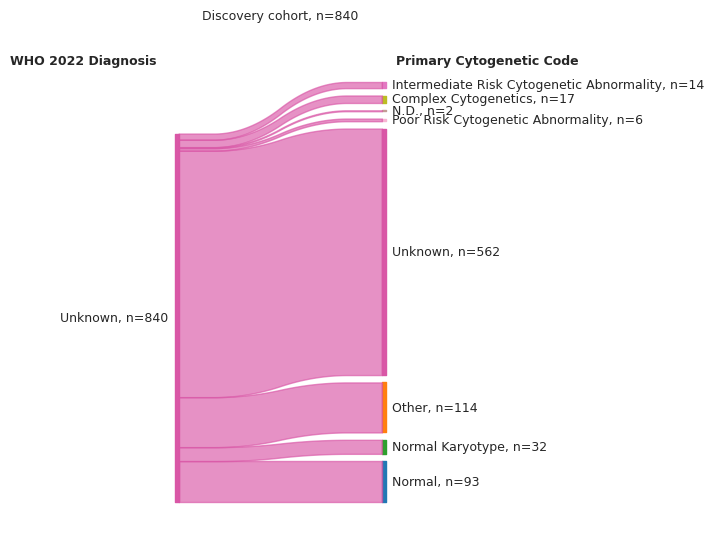

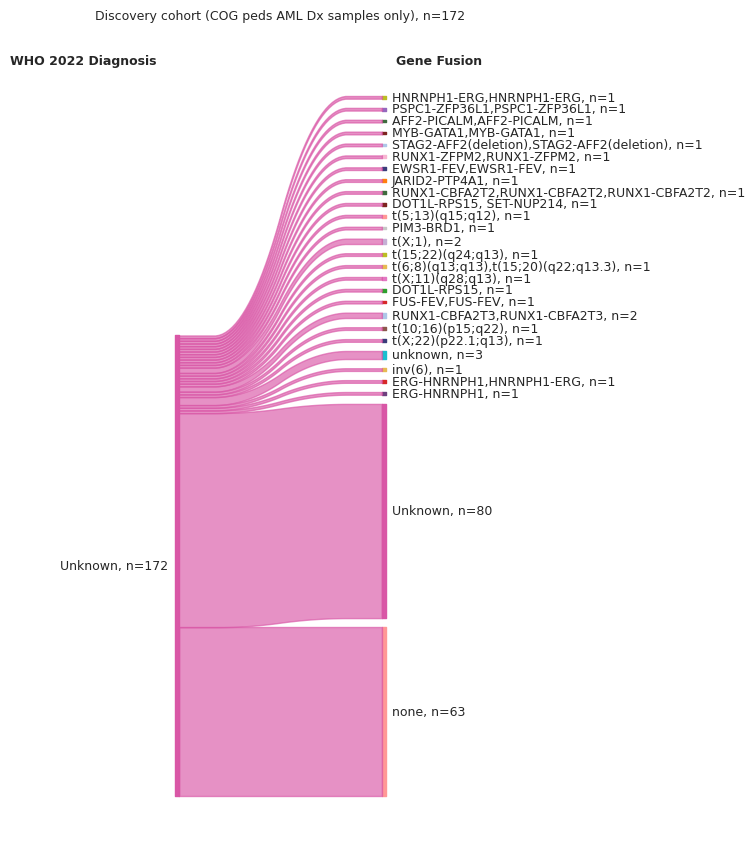

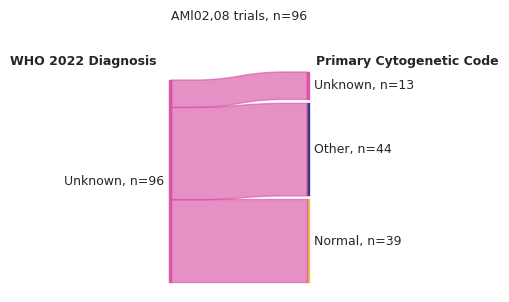

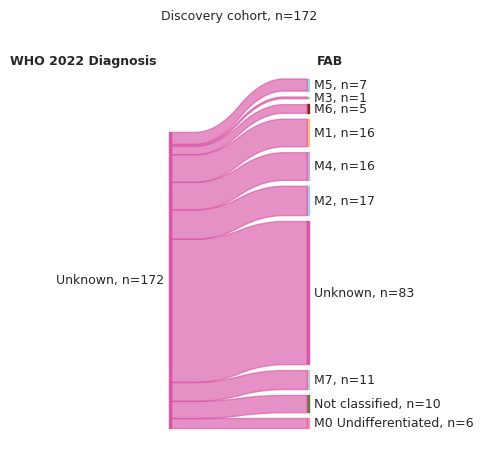

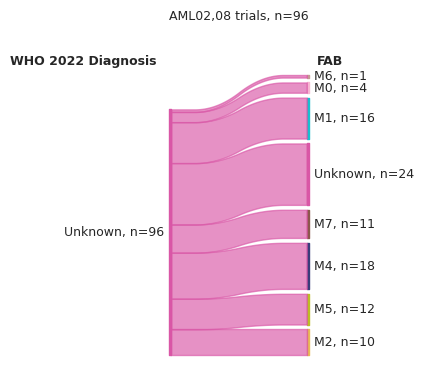

In [28]:
draw_sankey_plot(df_train, 'WHO 2022 Diagnosis', 'Primary Cytogenetic Code', colors,
                 title='Discovery cohort', fig_size=(3, 6),
                 fontsize=9, nan_action='keep-only')

draw_sankey_plot(df_px2, 'WHO 2022 Diagnosis', 'Gene Fusion', colors,
                 title= 'Discovery cohort (COG peds AML Dx samples only)',fig_size=(3, 10),
                 fontsize=9, nan_action='keep-only')

draw_sankey_plot(df_test, 'WHO 2022 Diagnosis', 'Primary Cytogenetic Code', colors,
                 title= 'AMl02,08 trials',fig_size=(2, 3),
                 fontsize=9, nan_action='keep-only')

draw_sankey_plot(df_px2, 'WHO 2022 Diagnosis', 'FAB', colors,
                 title= 'Discovery cohort',fig_size=(2, 5),
                 fontsize=9, nan_action='keep-only')

draw_sankey_plot(df_test, 'WHO 2022 Diagnosis', 'FAB', colors,
                 title= 'AML02,08 trials',fig_size=(2, 4),
                 fontsize=9, nan_action='keep-only')

### Nanopore test results

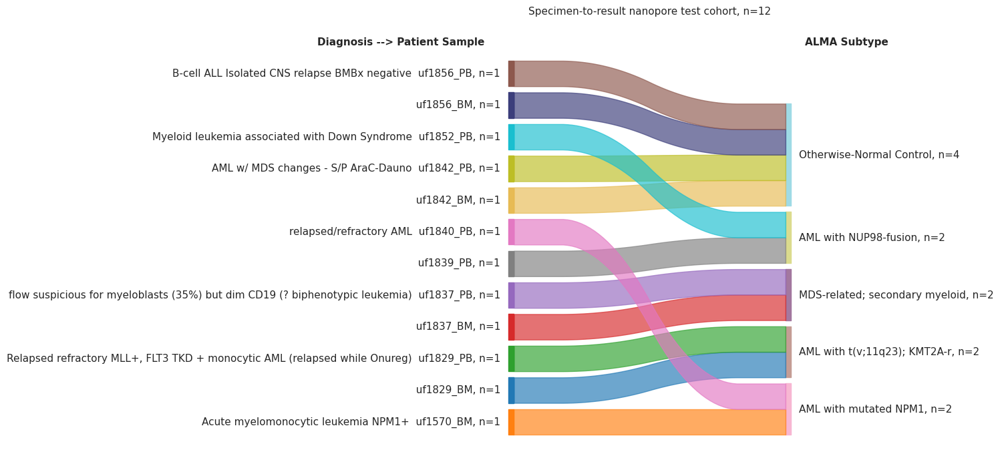

In [29]:
dfsank = df[df['Clinical Trial'] == 'UF HemBank']
dfsank = dfsank.reset_index()

# If values are repeated in dfsank['Dx at Acquisition], replace second value with empty string
dfsank['Dx at Acquisition'] = dfsank['Dx at Acquisition'].where(~dfsank['Dx at Acquisition'].duplicated(keep='last'), '')

dfsank['Diagnosis --> Patient Sample'] = dfsank['Dx at Acquisition'] + '  ' + dfsank['index']

draw_sankey_plot(dfsank, 'Diagnosis --> Patient Sample',model_name1,
                 title= 'Specimen-to-result nanopore test cohort',fig_size=(6, 8),
                 fontsize=11, nan_action='drop1', colors=colors)

### NOPHO AML

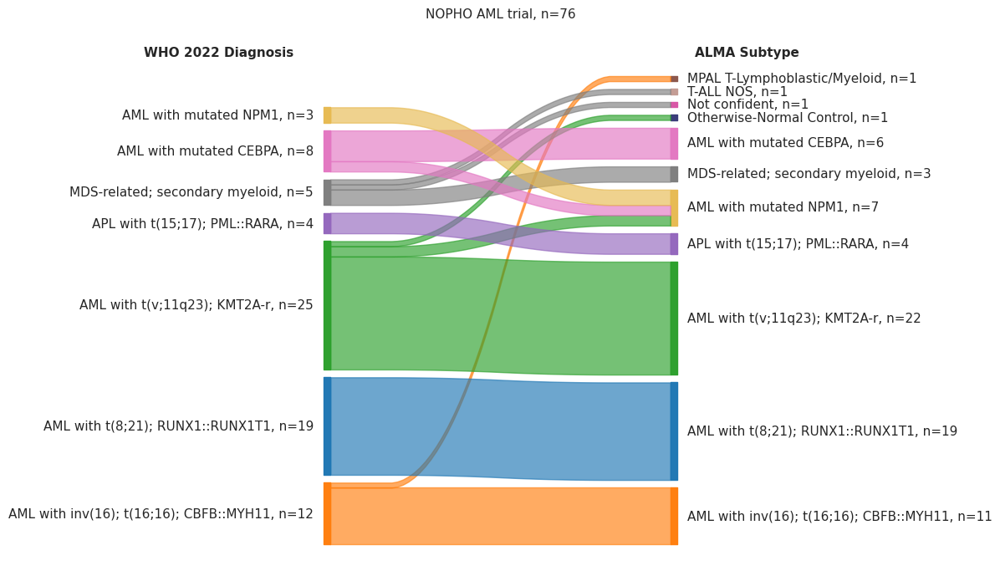

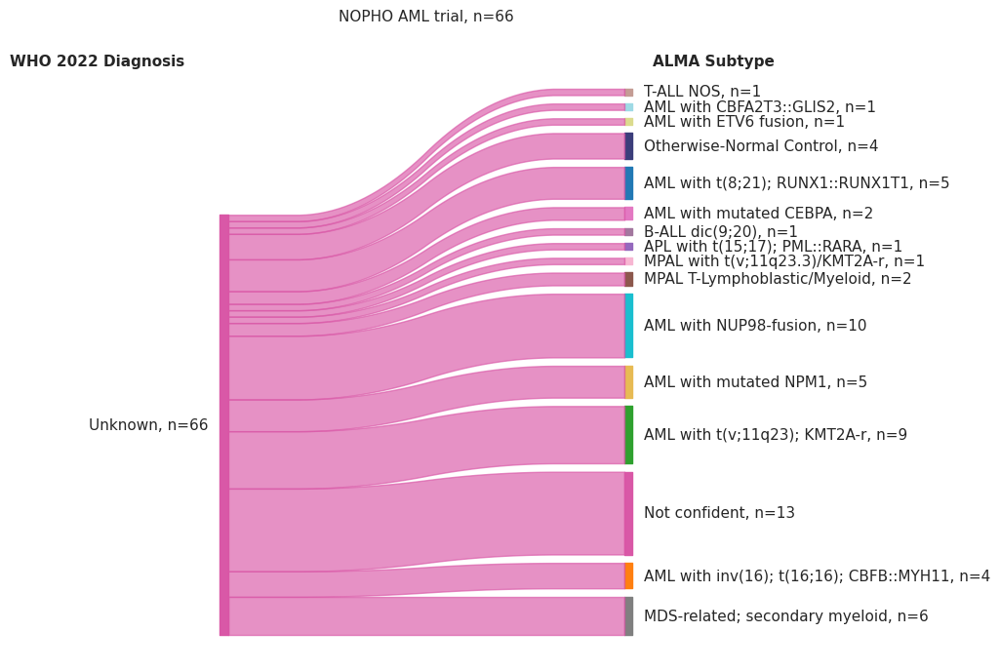

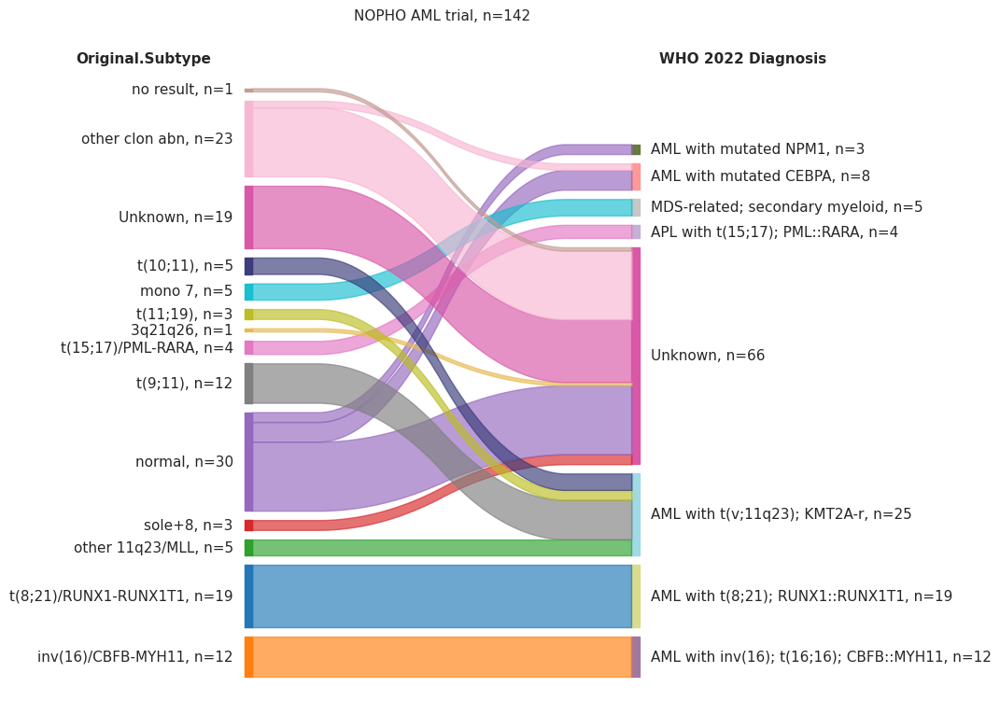

In [30]:
nopho_aml2 = nopho_aml.reset_index()
nopho_aml2['Subtype'] = nopho_aml2['Subtype'].replace({'Undefined': np.nan})

draw_sankey_plot(nopho_aml2, 'WHO 2022 Diagnosis',model_name1,
                 title= 'NOPHO AML trial',fig_size=(6, 8),
                 fontsize=11, nan_action='drop1', colors=colors)

draw_sankey_plot(nopho_aml2, 'WHO 2022 Diagnosis',model_name1,
                 title= 'NOPHO AML trial',fig_size=(6, 8),
                 fontsize=11, nan_action='keep-only', colors=colors)

draw_sankey_plot(nopho_aml2, 'Original.Subtype','WHO 2022 Diagnosis',
                 title= 'NOPHO AML trial',fig_size=(6, 9),
                 fontsize=11, nan_action='include', colors=colors)

## Performance metrics

### Prognosis

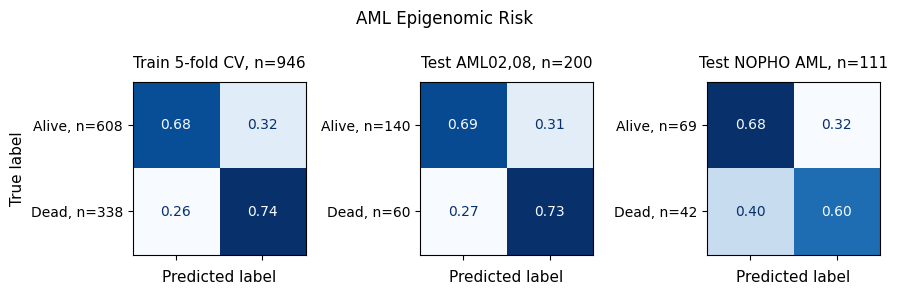


Metrics:
|                 |   Accuracy |   Sensitivity |   Specificity |   Precision |   F1-score |   AUC-ROC |
|:----------------|-----------:|--------------:|--------------:|------------:|-----------:|----------:|
| Train 5-fold CV |      0.704 |         0.74  |         0.684 |       0.566 |      0.641 |     0.712 |
| Test AML02,08   |      0.7   |         0.733 |         0.686 |       0.5   |      0.595 |     0.71  |
| Test NOPHO AML  |      0.649 |         0.595 |         0.681 |       0.532 |      0.562 |     0.638 |


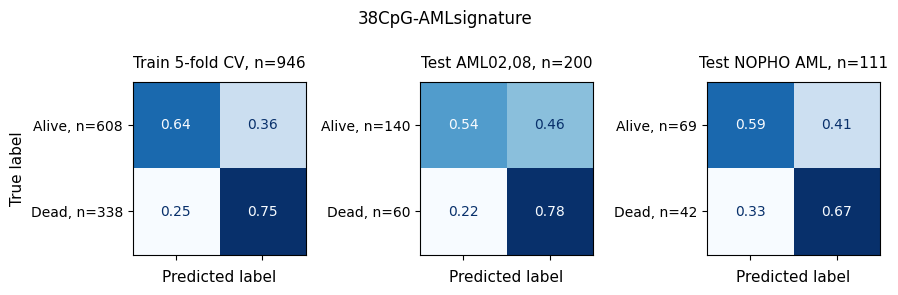


Metrics:
|                 |   Accuracy |   Sensitivity |   Specificity |   Precision |   F1-score |   AUC-ROC |
|:----------------|-----------:|--------------:|--------------:|------------:|-----------:|----------:|
| Train 5-fold CV |      0.675 |         0.746 |         0.637 |       0.533 |      0.621 |     0.691 |
| Test AML02,08   |      0.615 |         0.783 |         0.543 |       0.423 |      0.55  |     0.663 |
| Test NOPHO AML  |      0.622 |         0.667 |         0.594 |       0.5   |      0.571 |     0.63  |


In [23]:
nopho_aml['AML Epigenomic Risk_int'] = nopho_aml['AML Epigenomic Risk'].map({'Low': 0, 'High': 1})
nopho_aml['38CpG-AMLsignature_int'] = nopho_aml['38CpG-AMLsignature'].map({'Low': 0, 'High': 1})

# Enforce integer type
df_px2['os.evnt at 5y'] = df_px2['os.evnt at 5y'].astype(int)
df_test['os.evnt at 5y'] = df_test['os.evnt at 5y'].astype(int)

# dropna from 'AML Epigenomic Risk_int' and '38CpG-AMLsignature_int'
nopho_aml2 = nopho_aml.dropna(subset=['AML Epigenomic Risk_int', '38CpG-AMLsignature_int'])

df_dict = {
    'Train 5-fold CV': df_px2,
    'Test AML02,08': df_test,
    'Test NOPHO AML': nopho_aml2
}

plot_confusion_matrix_stacked(
    df_dict=df_dict,
    true_col='os.evnt at 5y',
    pred_col=model_name2 + '_int',
    class_col='os.evnt at 5y',  
    title=str(model_name2),
    figsize_per_plot=(3, 3),
)

plot_confusion_matrix_stacked(
    df_dict=df_dict,
    true_col='os.evnt at 5y',
    pred_col=model_name3 + '_int',
    class_col='os.evnt at 5y',  
    title=str(model_name3),
    figsize_per_plot=(3, 3),
)


### Diagnosis

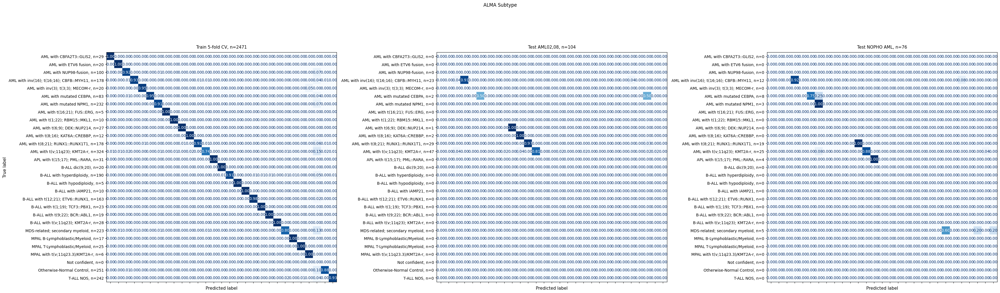


Metrics:
|                 |   Accuracy |   Weighted F1 |   Cohen's Kappa |
|:----------------|-----------:|--------------:|----------------:|
| Train 5-fold CV |      0.896 |         0.927 |           0.888 |
| Test AML02,08   |      0.875 |         0.924 |           0.825 |
| Test NOPHO AML  |      0.895 |         0.925 |           0.869 |


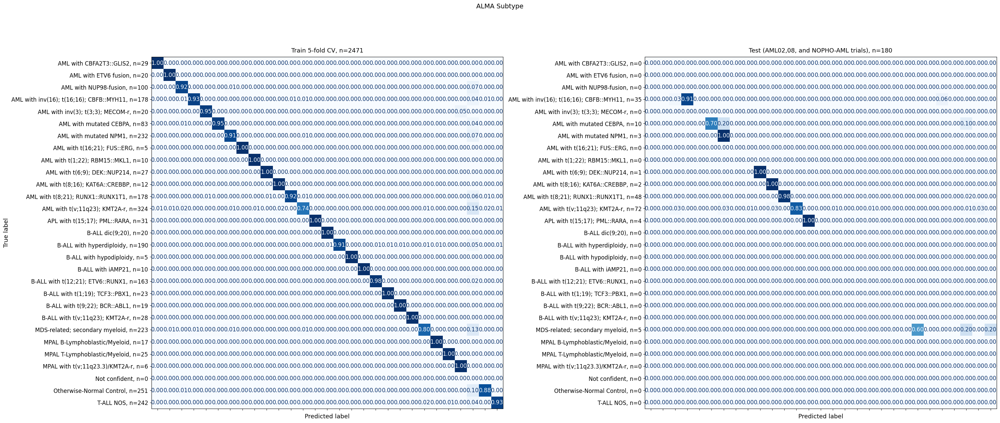


Metrics:
|                                       |   Accuracy |   Weighted F1 |   Cohen's Kappa |
|:--------------------------------------|-----------:|--------------:|----------------:|
| Train 5-fold CV                       |      0.896 |         0.927 |           0.888 |
| Test (AML02,08, and NOPHO-AML trials) |      0.883 |         0.925 |           0.846 |


In [14]:
# Drop nans from df_test['WHO 2022 Diagnosis']
df_test2 = df_test.dropna(subset=['WHO 2022 Diagnosis'])
nopho_aml2 = nopho_aml.dropna(subset=['WHO 2022 Diagnosis'])

df_dict = {
    'Train 5-fold CV': df_dx.fillna('Not confident'),
    'Test AML02,08': df_test2.fillna('Not confident'),
    'Test NOPHO AML': nopho_aml2.fillna('Not confident')
}

plot_confusion_matrix_stacked(
    df_dict=df_dict,
    true_col='WHO 2022 Diagnosis',
    pred_col=model_name1,
    class_col='WHO 2022 Diagnosis',  
    title=str(model_name1),
    figsize_per_plot=(12, 12),
    
)

# Combine nopho_aml2 and df_test2
df_test_nopho = pd.concat([df_test2, nopho_aml2])

df_dict = {
    'Train 5-fold CV': df_dx.fillna('Not confident'),
    'Test (AML02,08, and NOPHO-AML trials)': df_test_nopho.fillna('Not confident')
}

plot_confusion_matrix_stacked(
    df_dict=df_dict,
    true_col='WHO 2022 Diagnosis',
    pred_col=model_name1,
    class_col='WHO 2022 Diagnosis',  
    title=str(model_name1),
    figsize_per_plot=(15, 14),
    tick_fontsize=12,
    label_fontsize=12,
)

## Box plots

### AML Epigenomic Risk

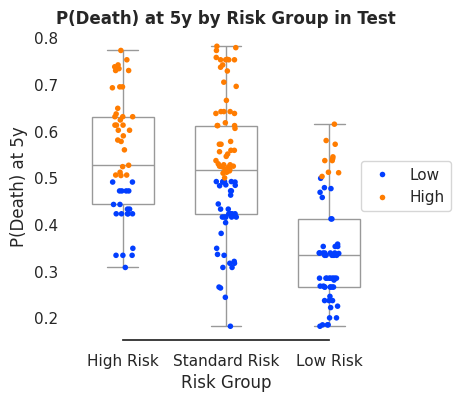

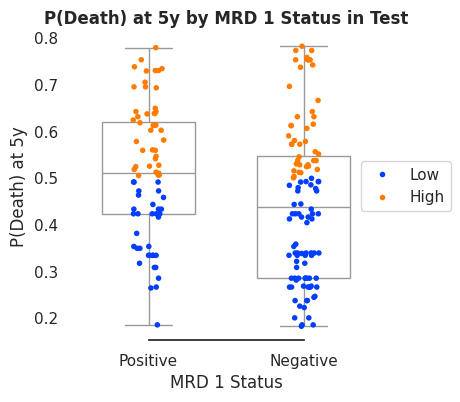

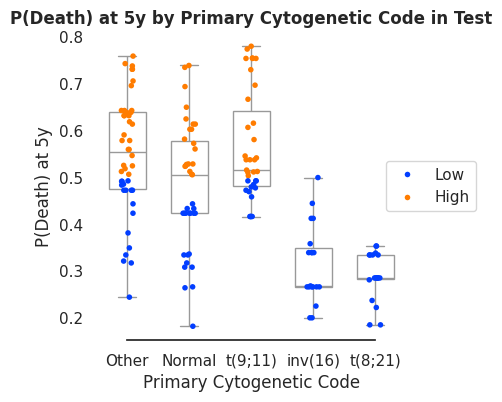

In [29]:
draw_boxplot(df=df_test,x='Risk Group', y='P(Death) at 5y',
                order=['High Risk', 'Standard Risk', 'Low Risk'],
                trialname='Test', hue=model_name2,
                save_plot=False, figsize=(4,4))

draw_boxplot(df=df_test,x='MRD 1 Status', y='P(Death) at 5y',
                order=['Positive','Negative'],
                trialname='Test', hue=model_name2,
                save_plot=False, figsize=(4,4))

draw_boxplot(df=df_test,x='Primary Cytogenetic Code', y='P(Death) at 5y',
                order='auto',
                trialname='Test', hue=model_name2,
                save_plot=False, figsize=(4,4))

### 38CpG-AMLsignature

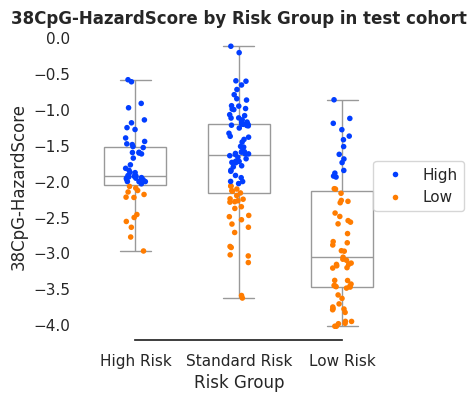

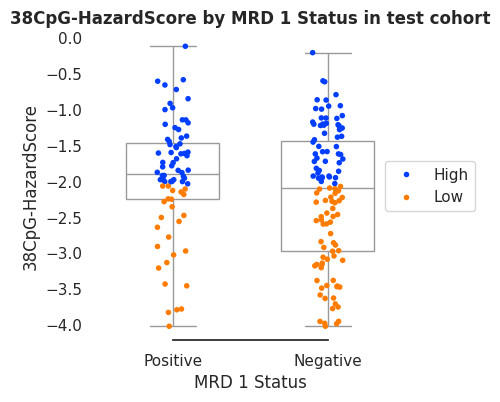

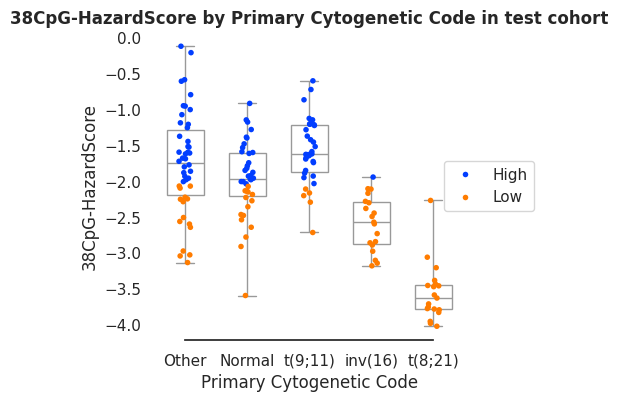

In [30]:
draw_boxplot(df=df_test,x='Risk Group', y='38CpG-HazardScore',
                order=['High Risk', 'Standard Risk', 'Low Risk'],
                trialname='test cohort', hue=model_name3,
                save_plot=False, figsize=(4,4))

draw_boxplot(df=df_test,x='MRD 1 Status', y='38CpG-HazardScore',
                order=['Positive','Negative'],
                trialname='test cohort', hue=model_name3,
                save_plot=False, figsize=(4,4))

draw_boxplot(df=df_test,x='Primary Cytogenetic Code', y='38CpG-HazardScore',
                order='auto',
                trialname='test cohort', hue=model_name3,
                save_plot=False, figsize=(4,4))

## Stacked bar plots

### AML Epigenomic Risk

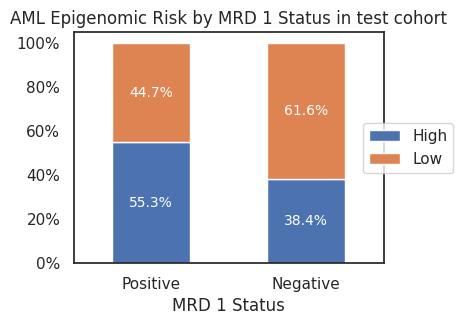

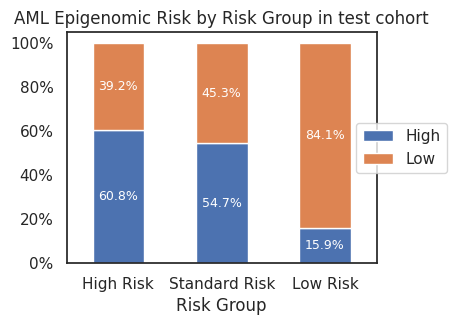

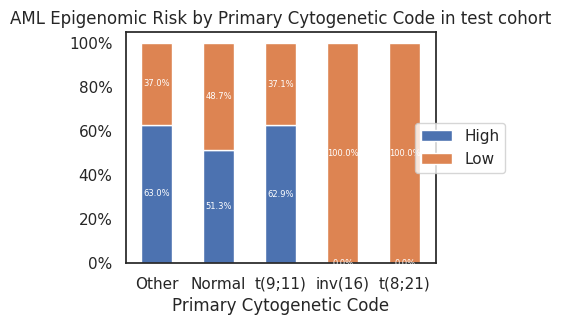

In [31]:
draw_stacked_barplot(df=df_test,x='MRD 1 Status', y=model_name2,
             order=['Positive','Negative'],
             trialname='test cohort', hue=model_name2,
             save_plot=False, figsize=(4,3))

draw_stacked_barplot(df=df_test,x='Risk Group', y=model_name2,
                order=['High Risk', 'Standard Risk', 'Low Risk'],
                trialname='test cohort', hue=model_name2,
                save_plot=False, figsize=(4,3), fontsize=9)

draw_stacked_barplot(df=df_test,x='Primary Cytogenetic Code', y=model_name2,
                order='auto',
                trialname='test cohort', hue=model_name2,
                save_plot=False, figsize=(4,3), fontsize=6)

### 38CpG-AMLsignature

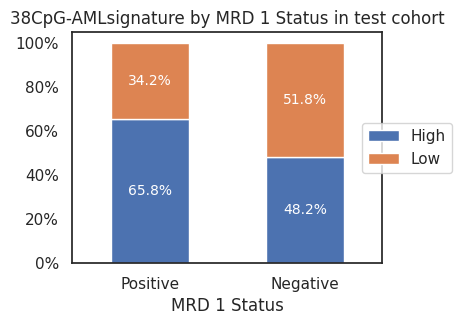

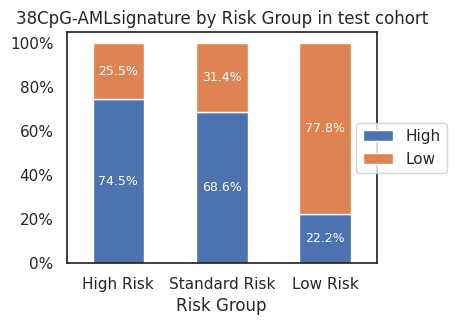

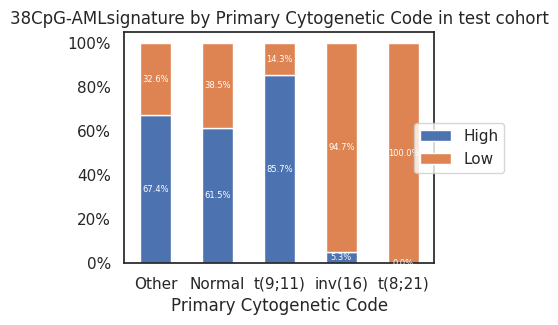

In [32]:
draw_stacked_barplot(df=df_test,x='MRD 1 Status', y=model_name3,
             order=['Positive','Negative'],
             trialname='test cohort', hue=model_name3,
             save_plot=False, figsize=(4,3))

draw_stacked_barplot(df=df_test,x='Risk Group', y=model_name3,
                order=['High Risk', 'Standard Risk', 'Low Risk'],
                trialname='test cohort', hue=model_name3,
                save_plot=False, figsize=(4,3), fontsize=9)

draw_stacked_barplot(df=df_test,x='Primary Cytogenetic Code', y=model_name3,
                order='auto',
                trialname='test cohort', hue=model_name3,
                save_plot=False, figsize=(4,3), fontsize=6)

## Watermark

In [14]:
%load_ext watermark

In [15]:
# watermark with all libraries used in this notebook
%watermark -v -p pandas,seaborn,matplotlib,tableone,sklearn,lifelines,scipy -a Francisco_Marchi@Lamba_Lab_UF -d -m -r -u

Author: Francisco_Marchi@Lamba_Lab_UF

Last updated: 2025-03-14

Python implementation: CPython
Python version       : 3.10.13
IPython version      : 8.27.0

pandas    : 2.2.2
seaborn   : 0.13.2
matplotlib: 3.9.2
tableone  : 0.8.0
sklearn   : 1.5.2
lifelines : 0.28.0
scipy     : 1.12.0

Compiler    : GCC 11.4.0
OS          : Linux
Release     : 5.15.133.1-microsoft-standard-WSL2
Machine     : x86_64
Processor   : x86_64
CPU cores   : 32
Architecture: 64bit

Git repo: git@github.com:f-marchi/ALMA.git

